# Análisis del Dataset "Default of Credit Card Clients"

## Carga de datos

In [141]:
import empiricaldist
import janitor
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy.stats
import seaborn as sns
import sklearn.metrics
import statsmodels.api as sm
import statsmodels.formula.api as smf
import statsmodels.stats as ss
import warnings
warnings.filterwarnings("ignore")

In [142]:
%matplotlib inline
sns.set_style(style='whitegrid')
sns.set_context(context='notebook')
plt.rcParams['figure.figsize'] = (11, 9.4)

In [143]:
raw_df = pd.read_excel('./default of credit card clients.xls', header=1, index_col=0)
preprocessed_df = raw_df.copy()
raw_df

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
ID,,,,,,,,,,,,,,,,,,,,,
1,20000,2,2,1,24,2,2,-1,-1,-2,...,0,0,0,0,689,0,0,0,0,1
2,120000,2,2,2,26,-1,2,0,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
3,90000,2,2,2,34,0,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
4,50000,2,2,1,37,0,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
5,50000,1,2,1,57,-1,0,-1,0,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29996,220000,1,3,1,39,0,0,0,0,0,...,88004,31237,15980,8500,20000,5003,3047,5000,1000,0
29997,150000,1,3,2,43,-1,-1,-1,-1,0,...,8979,5190,0,1837,3526,8998,129,0,0,0
29998,30000,1,2,2,37,4,3,2,-1,0,...,20878,20582,19357,0,0,22000,4200,2000,3100,1


## Validación de datos

### ¿Qué tipo de dato son las variables del conjunto de datos?

In [144]:
preprocessed_df.dtypes

LIMIT_BAL                     int64
SEX                           int64
EDUCATION                     int64
MARRIAGE                      int64
AGE                           int64
PAY_0                         int64
PAY_2                         int64
PAY_3                         int64
PAY_4                         int64
PAY_5                         int64
PAY_6                         int64
BILL_AMT1                     int64
BILL_AMT2                     int64
BILL_AMT3                     int64
BILL_AMT4                     int64
BILL_AMT5                     int64
BILL_AMT6                     int64
PAY_AMT1                      int64
PAY_AMT2                      int64
PAY_AMT3                      int64
PAY_AMT4                      int64
PAY_AMT5                      int64
PAY_AMT6                      int64
default payment next month    int64
dtype: object

### ¿Cuántas variables y observaciones tenemos en el conjunto de datos?

In [145]:
preprocessed_df.shape

(30000, 24)

### ¿Existen valores nulos explicitos en el conjunto de datos?

In [146]:
preprocessed_df.isnull().any()

LIMIT_BAL                     False
SEX                           False
EDUCATION                     False
MARRIAGE                      False
AGE                           False
PAY_0                         False
PAY_2                         False
PAY_3                         False
PAY_4                         False
PAY_5                         False
PAY_6                         False
BILL_AMT1                     False
BILL_AMT2                     False
BILL_AMT3                     False
BILL_AMT4                     False
BILL_AMT5                     False
BILL_AMT6                     False
PAY_AMT1                      False
PAY_AMT2                      False
PAY_AMT3                      False
PAY_AMT4                      False
PAY_AMT5                      False
PAY_AMT6                      False
default payment next month    False
dtype: bool

### Mapear las variables categóricas

In [147]:
preprocessed_df['SEX'] = preprocessed_df['SEX'].map({ 
    1: 'Male', 
    2: 'Female', 
}).astype('category')
preprocessed_df['SEX'] = preprocessed_df['SEX'].cat.reorder_categories(['Male', 'Female'], ordered=True)


preprocessed_df['EDUCATION'] = preprocessed_df['EDUCATION'].map({
    1: 'Graduate School',
    2: 'University',
    3: 'High School',
    4: 'Others',
}).astype('category')
preprocessed_df['EDUCATION'] = preprocessed_df['EDUCATION'].cat.reorder_categories(['Graduate School', 'University', 'High School', 'Others'], ordered=True)

preprocessed_df['MARRIAGE'] = preprocessed_df['MARRIAGE'].map({
    1: 'Married',
    2: 'Single',
    3: 'Others',
}).astype('category')
preprocessed_df['MARRIAGE'] = preprocessed_df['MARRIAGE'].cat.reorder_categories(['Married', 'Single', 'Others'], ordered=True)

for pay_column in preprocessed_df.columns[5:11]:
    preprocessed_df[pay_column] = preprocessed_df[pay_column].map({
        -1: 'Paid on time',
        0: 'Paid on time',
        1: 'Delay 1 Month',
        2: 'Delay 2 Months',
        3: 'Delay 3 Months',
        4: 'Delay 4 Months',
        5: 'Delay 5 Months',
        6: 'Delay 6 Months',
        7: 'Delay 7 Months',
        8: 'Delay 8 Months',
        9: 'Delay 9+ Months',
    }).astype('category')
    preprocessed_df[pay_column] = preprocessed_df[pay_column].cat.set_categories([
        'Paid on time',
        'Delay 1 Month',
        'Delay 2 Months',
        'Delay 3 Months',
        'Delay 4 Months',
        'Delay 5 Months',
        'Delay 6 Months',
        'Delay 7 Months',
        'Delay 8 Months',
        'Delay 9+ Months',
    ], ordered=True)

preprocessed_df['default payment next month'] = preprocessed_df['default payment next month'].map({
    0: 'Not Defaulted',
    1: 'Defaulted',
}).astype('category')
preprocessed_df['default payment next month'] = preprocessed_df['default payment next month'].cat.reorder_categories(['Not Defaulted', 'Defaulted'], ordered=True)

### Renombrar las columnas

In [148]:
preprocessed_df = preprocessed_df.rename(columns={
    'LIMIT_BAL': 'Credit Limit',
    'SEX': 'Sex',
    'EDUCATION': 'Education',
    'MARRIAGE': 'Marriage',
    'AGE': 'Age',
    'PAY_0': 'Payed Status in September',
    'PAY_2': 'Payed Status in August',
    'PAY_3': 'Payed Status in July',
    'PAY_4': 'Payed Status in June',
    'PAY_5': 'Payed Status in May',
    'PAY_6': 'Payed Status in April',
    'BILL_AMT1': 'Bill Amount in September',
    'BILL_AMT2': 'Bill Amount in August',
    'BILL_AMT3': 'Bill Amount in July',
    'BILL_AMT4': 'Bill Amount in June',
    'BILL_AMT5': 'Bill Amount in May',
    'BILL_AMT6': 'Bill Amount in April',
    'PAY_AMT1': 'Amount Paid in September',
    'PAY_AMT2': 'Amount Paid in August',
    'PAY_AMT3': 'Amount Paid in July',
    'PAY_AMT4': 'Amount Paid in June',
    'PAY_AMT5': 'Amount Paid in May',
    'PAY_AMT6': 'Amount Paid in April',
    'default payment next month': 'Defaulted Payment Next Month',
})

### De tener observaciones con valores inconsistentes (nulos), ¿cuántas tenemos por cada variable?

In [149]:
preprocessed_df.isnull().sum().sort_values(ascending=False)

Payed Status in April           4895
Payed Status in May             4546
Payed Status in June            4348
Payed Status in July            4085
Payed Status in August          3782
Payed Status in September       2759
Education                        345
Marriage                          54
Credit Limit                       0
Bill Amount in April               0
Amount Paid in April               0
Amount Paid in May                 0
Amount Paid in June                0
Amount Paid in July                0
Amount Paid in August              0
Amount Paid in September           0
Bill Amount in August              0
Bill Amount in May                 0
Bill Amount in June                0
Bill Amount in July                0
Sex                                0
Bill Amount in September           0
Age                                0
Defaulted Payment Next Month       0
dtype: int64

### ¿Cuántos valores nulos tenemos en total en el conjunto de datos?

In [150]:
preprocessed_df.isnull().sum().sum()

24814

### ¿Cuál es la proporción de valores nulos por cada variable?

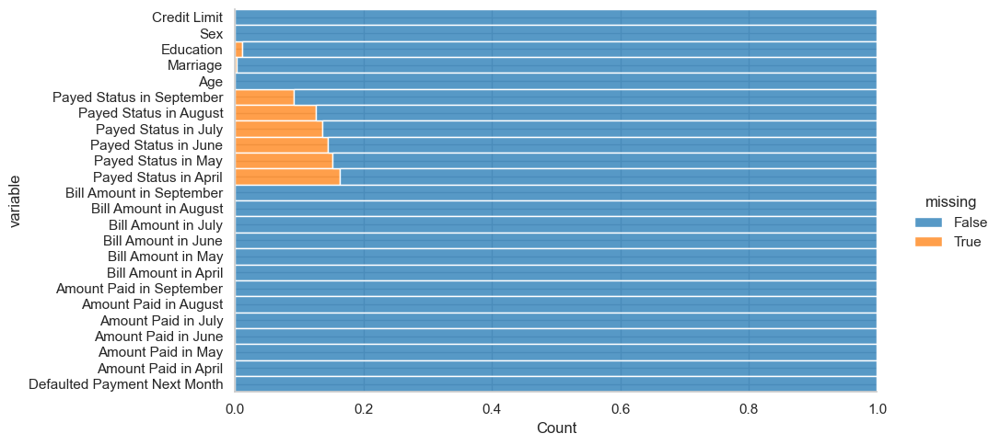

In [151]:
(
    preprocessed_df
    .isnull()
    .melt(value_name='missing')
    .pipe(
        lambda df: (
            sns.displot(
                data=df,
                y='variable',
                hue='missing',
                multiple='fill',
                aspect=2
            )
        )
    )
)

### ¿Cómo podemos visualizar los valores nulos en todo el conjunto de datos?

Se observan líneas verticales en la gráfica, lo que indica que los valores nulos suelen acumularse en los mismos registros para las variables de "Payed Status".

<Axes: xlabel='ID'>

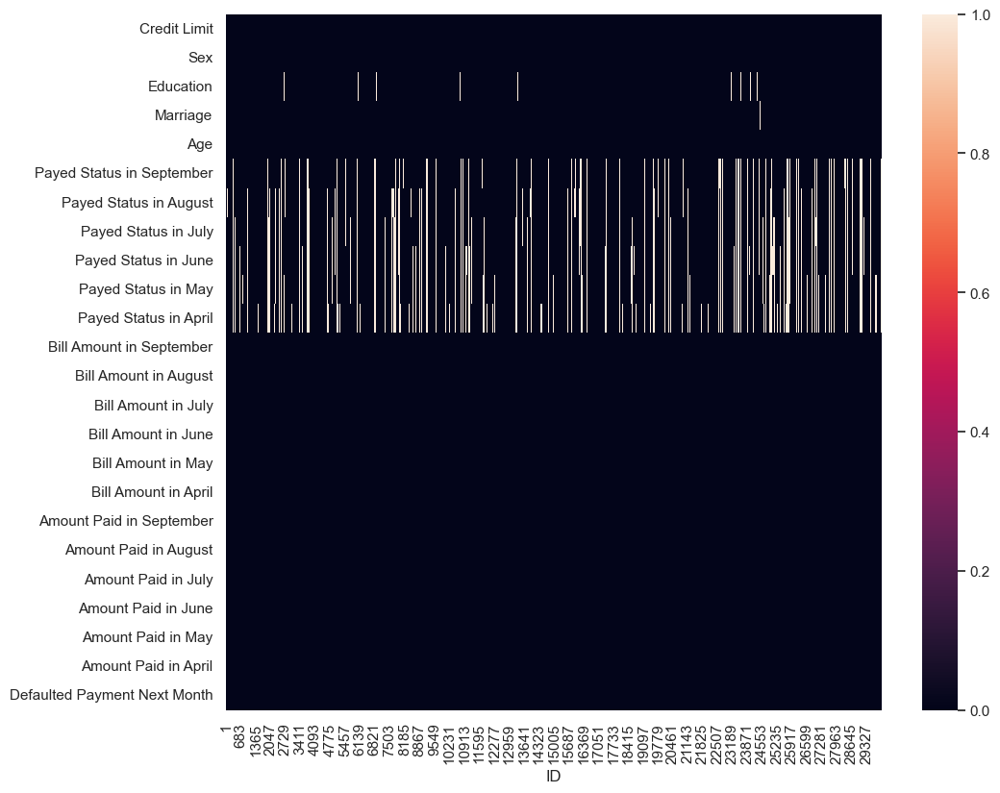

In [152]:
(
    preprocessed_df
    .isnull()
    .transpose()
    .pipe(
        lambda df: sns.heatmap(data=df)
    )
)

### ¿Cuántas observaciones perdemos si eliminamos los datos faltantes?

In [153]:
processed_df = preprocessed_df.dropna()
print("Se eliminaron", preprocessed_df.shape[0] - processed_df.shape[0], "filas")

Se eliminaron 6850 filas


### Transformar las variables categóricas a numéricas

In [154]:
numeric_df = preprocessed_df.copy()
numeric_df['Defaulted Payment'] = numeric_df['Defaulted Payment Next Month']  # Save a copy of the target variable as categorical
numeric_df['Sex'] = numeric_df['Sex'].map({ 'Male': 0, 'Female': 1 }).astype(float)
numeric_df['Education'] = numeric_df['Education'].map({ 'Graduate School': 3, 'University': 2, 'High School': 1, 'Others': 0 }).astype(float)
numeric_df['Marriage'] = numeric_df['Marriage'].map({ 'Married': 2, 'Single': 1, 'Others': 0 }).astype(float)
numeric_df['Defaulted Payment Next Month'] = numeric_df['Defaulted Payment Next Month'].map({ 'Not Defaulted': 0, 'Defaulted': 1 }).astype(float)
for pay_column in numeric_df.columns[5:11]:
    numeric_df[pay_column] = numeric_df[pay_column].map({
        'Paid on time': 0,
        'Delay 1 Month': 1,
        'Delay 2 Months': 2,
        'Delay 3 Months': 3,
        'Delay 4 Months': 4,
        'Delay 5 Months': 5,
        'Delay 6 Months': 6,
        'Delay 7 Months': 7,
        'Delay 8 Months': 8,
        'Delay 9+ Months': 9,
    }).astype(float)

## Paletas de colores

In [155]:
sex_color = {
    'Male': '#ff6602ff',
    'Female': '#0f7175ff'
}

education_color = {
    'Graduate School': '#ff6602ff',
    'University': '#0f7175ff',
    'High School': '#c65dc9ff',
    'Others': '#ffcc02ff'
}

marriage_color = {
    'Married': '#ff6602ff',
    'Single': '#0f7175ff',
    'Others': '#c65dc9ff'
}

payed_status_color = {
    'Paid on time': '#0f7175ff',
    'Delay 1 Month': '#ff6602ff',
    'Delay 2 Months': '#c65dc9ff',
    'Delay 3 Months': '#ffcc02ff',
    'Delay 4 Months': '#ff0000ff',
    'Delay 5 Months': '#00ff00ff',
    'Delay 6 Months': '#0000ffff',
    'Delay 7 Months': '#ff00ffff',
    'Delay 8 Months': '#00ffffff',
    'Delay 9+ Months': '#000000ff'
}

defaulted_color = {
    'Not Defaulted': '#0f7175ff',
    'Defaulted': '#ff6602ff'
}

## Conteos y proporciones

### Variables numéricas

In [156]:
processed_df.describe(include=[np.number])

,Credit Limit,Age,Bill Amount in September,Bill Amount in August,Bill Amount in July,Bill Amount in June,Bill Amount in May,Bill Amount in April,Amount Paid in September,Amount Paid in August,Amount Paid in July,Amount Paid in June,Amount Paid in May,Amount Paid in April
count,23150.000000,23150.000000,23150.000000,23150.000000,23150.000000,23150.000000,23150.000000,23150.000000,23150.000000,2.315000e+04,23150.000000,23150.000000,23150.000000,23150.000000
mean,156266.681641,35.243758,61297.551317,59679.484017,57356.527343,53277.140734,49798.907819,47928.621339,6074.562030,6.119303e+03,5561.930929,5089.300086,5049.702505,5335.153521
std,127582.332349,9.291339,77610.700174,75201.199639,72376.531729,68071.436636,64347.900377,63118.460982,16904.322834,2.030216e+04,18132.905478,15543.704453,14950.392891,17300.294953
min,10000.000000,21.000000,-165580.000000,-67526.000000,-157264.000000,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000
25%,50000.000000,28.000000,9787.250000,10057.500000,10267.500000,9908.000000,9222.750000,7725.500000,1402.000000,1.332000e+03,1000.000000,737.000000,714.250000,632.000000
50%,120000.000000,34.000000,33741.500000,32767.500000,30365.000000,28293.500000,26370.500000,25037.500000,2596.500000,2.500000e+03,2000.000000,2000.000000,2000.000000,2000.000000
75%,220000.000000,41.000000,80924.500000,78902.500000,75601.000000,70254.500000,65339.250000,62251.250000,5500.000000,5.178000e+03,5000.000000,4759.250000,4684.000000,4504.750000
max,1000000.000000,79.000000,964511.000000,983931.000000,693131.000000,891586.000000,927171.000000,961664.000000,873552.000000,1.227082e+06,896040.000000,621000.000000,426529.000000,528666.000000


### Variables categóricas

In [157]:
processed_df.describe(include=['category'])

,Sex,Education,Marriage,Payed Status in September,Payed Status in August,Payed Status in July,Payed Status in June,Payed Status in May,Payed Status in April,Defaulted Payment Next Month
count,23150,23150,23150,23150,23150,23150,23150,23150,23150,23150
unique,2,4,3,9,9,9,9,8,8,2
top,Female,University,Single,Paid on time,Paid on time,Paid on time,Paid on time,Paid on time,Paid on time,Not Defaulted
freq,13694,11519,12527,18050,19026,19211,19808,20294,20159,17788


### Conteos de variables categóricas

<Axes: xlabel='Defaulted Payment Next Month', ylabel='Count'>

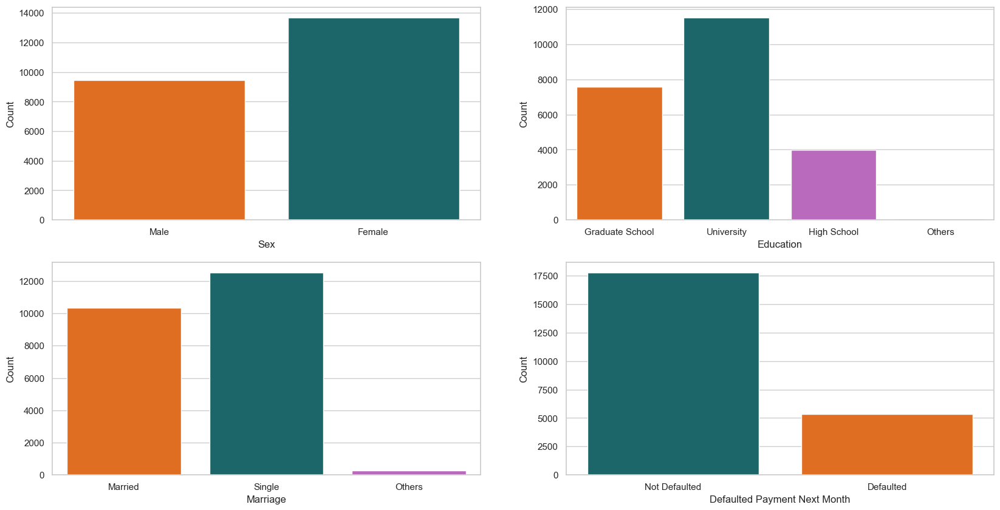

In [158]:
def plot_value_counts(column: str, palette: dict):
    return (
        processed_df
        .value_counts(column, sort=True)
        .reset_index(name='Count')
        .pipe(
            lambda df: (
                sns.barplot(
                    data=df,
                    x=column,
                    y='Count',
                    palette=palette,
                    ax=plt.gca(),
                )
            )
        )
    )

plt.figure(figsize=(20, 10))
plt.subplot(2, 2, 1)
plot_value_counts('Sex', sex_color)
plt.subplot(2, 2, 2)
plot_value_counts('Education', education_color)
plt.subplot(2, 2, 3)
plot_value_counts('Marriage', marriage_color)
plt.subplot(2, 2, 4)
plot_value_counts('Defaulted Payment Next Month', defaulted_color)

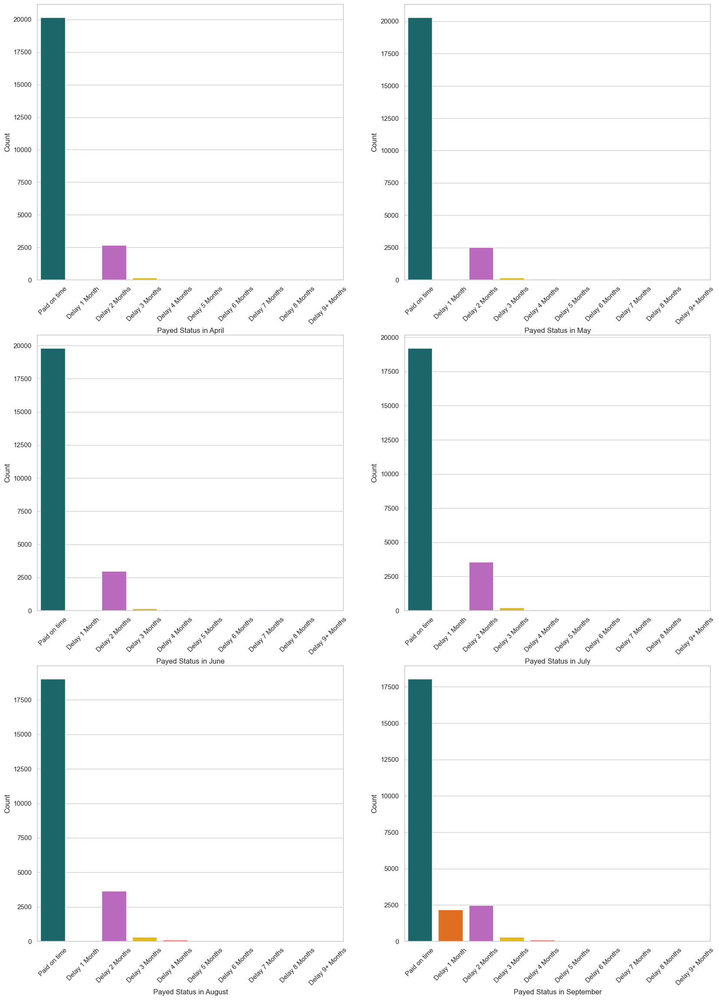

In [159]:
plt.figure(figsize=(20, 28))
plt.subplot(3, 2, 1)
plot_value_counts('Payed Status in April', payed_status_color)
plt.xticks(rotation=45)
plt.subplot(3, 2, 2)
plot_value_counts('Payed Status in May', payed_status_color)
plt.xticks(rotation=45)
plt.subplot(3, 2, 3)
plot_value_counts('Payed Status in June', payed_status_color)
plt.xticks(rotation=45)
plt.subplot(3, 2, 4)
plot_value_counts('Payed Status in July', payed_status_color)
plt.xticks(rotation=45)
plt.subplot(3, 2, 5)
plot_value_counts('Payed Status in August', payed_status_color)
plt.xticks(rotation=45)
plt.subplot(3, 2, 6)
plot_value_counts('Payed Status in September', payed_status_color)
plt.xticks(rotation=45);

### Proporciones de variables categóricas

<Axes: xlabel='Defaulted Payment Next Month %', ylabel='Count'>

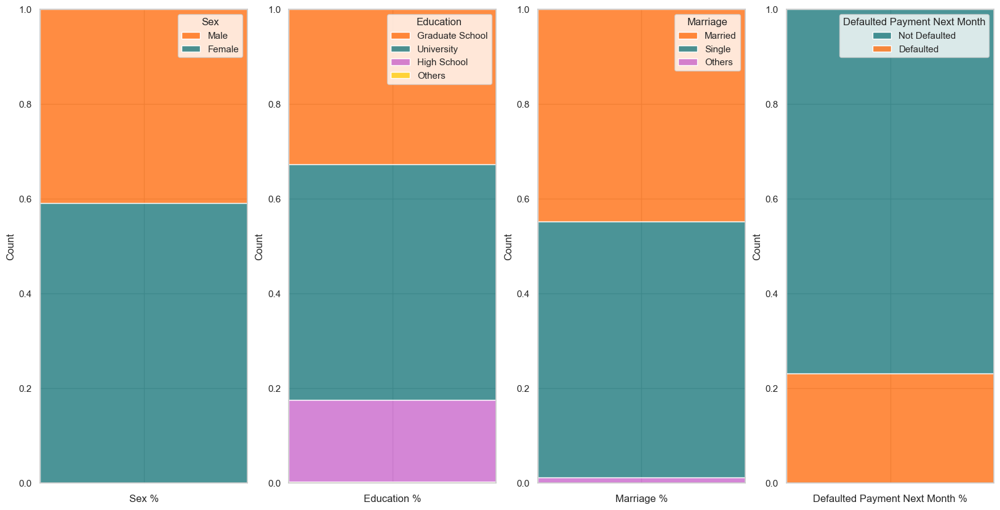

In [160]:
def plot_value_proportions(column: str, palette: dict):
    return (
        processed_df
        .add_column(f'{column} %', '')
        .pipe(
            lambda df: (
                sns.histplot(
                    data=df,
                    x=f'{column} %',
                    hue=column,
                    multiple='fill',
                    palette=palette,
                    ax=plt.gca(),
                )
            )
        )
    )

plt.figure(figsize=(20, 10))
plt.subplot(1, 4, 1)
plot_value_proportions('Sex', sex_color)
plt.subplot(1, 4, 2)
plot_value_proportions('Education', education_color)
plt.subplot(1, 4, 3)
plot_value_proportions('Marriage', marriage_color)
plt.subplot(1, 4, 4)
plot_value_proportions('Defaulted Payment Next Month', defaulted_color)

<Axes: xlabel='Payed Status in September %', ylabel='Count'>

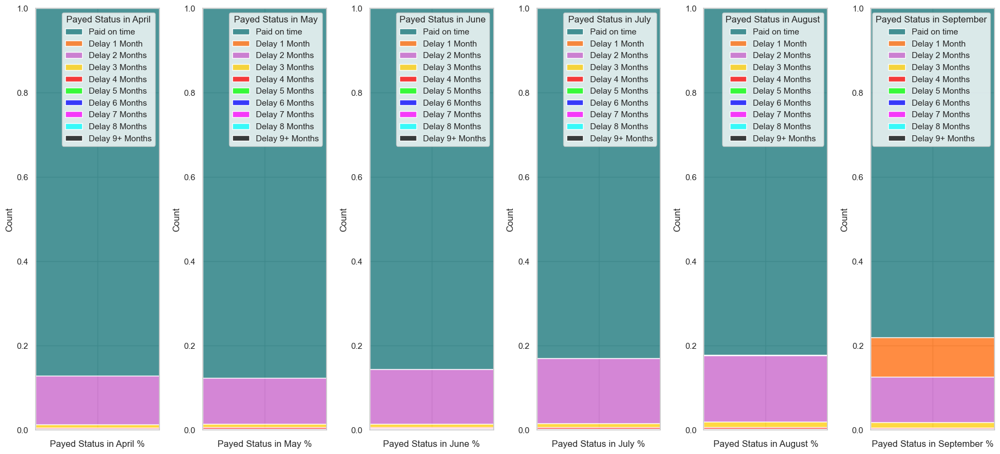

In [161]:
plt.figure(figsize=(20, 10))
plt.subplots_adjust(wspace=0.35, right=1.0)
plt.subplot(1, 6, 1)
plot_value_proportions('Payed Status in April', payed_status_color)
plt.subplot(1, 6, 2)
plot_value_proportions('Payed Status in May', payed_status_color)
plt.subplot(1, 6, 3)
plot_value_proportions('Payed Status in June', payed_status_color)
plt.subplot(1, 6, 4)
plot_value_proportions('Payed Status in July', payed_status_color)
plt.subplot(1, 6, 5)
plot_value_proportions('Payed Status in August', payed_status_color)
plt.subplot(1, 6, 6)
plot_value_proportions('Payed Status in September', payed_status_color)

## Medidas de tendencia central

### Promedio

In [162]:
processed_df.mean(numeric_only=True)

Credit Limit                156266.681641
Age                             35.243758
Bill Amount in September     61297.551317
Bill Amount in August        59679.484017
Bill Amount in July          57356.527343
Bill Amount in June          53277.140734
Bill Amount in May           49798.907819
Bill Amount in April         47928.621339
Amount Paid in September      6074.562030
Amount Paid in August         6119.302592
Amount Paid in July           5561.930929
Amount Paid in June           5089.300086
Amount Paid in May            5049.702505
Amount Paid in April          5335.153521
dtype: float64

### Mediana

In [163]:
processed_df.median(numeric_only=True)

Credit Limit                120000.0
Age                             34.0
Bill Amount in September     33741.5
Bill Amount in August        32767.5
Bill Amount in July          30365.0
Bill Amount in June          28293.5
Bill Amount in May           26370.5
Bill Amount in April         25037.5
Amount Paid in September      2596.5
Amount Paid in August         2500.0
Amount Paid in July           2000.0
Amount Paid in June           2000.0
Amount Paid in May            2000.0
Amount Paid in April          2000.0
dtype: float64

### Moda

In [164]:
processed_df.mode()

,Credit Limit,Sex,Education,Marriage,Age,Payed Status in September,Payed Status in August,Payed Status in July,Payed Status in June,Payed Status in May,...,Bill Amount in June,Bill Amount in May,Bill Amount in April,Amount Paid in September,Amount Paid in August,Amount Paid in July,Amount Paid in June,Amount Paid in May,Amount Paid in April,Defaulted Payment Next Month
0,50000,Female,University,Single,29,Paid on time,Paid on time,Paid on time,Paid on time,Paid on time,...,0,0,0,0,0,0,0,0,0,Not Defaulted


## Medidas de dispersión

### ¿Cuál es el rango de las variables?

In [165]:
(
    processed_df
    .select_dtypes(include=[np.number])
    .quantile(q=[0,1])
    .transpose()
    .rename_axis('metric')
    .rename(columns={0: 'min', 1: 'max'})
    .assign(
        range = lambda df: df['max'] - df['min']
    )
)

,min,max,range
metric,,,
Credit Limit,10000.0,1000000.0,990000.0
Age,21.0,79.0,58.0
Bill Amount in September,-165580.0,964511.0,1130091.0
Bill Amount in August,-67526.0,983931.0,1051457.0
Bill Amount in July,-157264.0,693131.0,850395.0
Bill Amount in June,-170000.0,891586.0,1061586.0
Bill Amount in May,-81334.0,927171.0,1008505.0
Bill Amount in April,-339603.0,961664.0,1301267.0
Amount Paid in September,0.0,873552.0,873552.0


### ¿Cuál es la desviación estándar de las variables?

In [166]:
processed_df.std(numeric_only=True)

Credit Limit                127582.332349
Age                              9.291339
Bill Amount in September     77610.700174
Bill Amount in August        75201.199639
Bill Amount in July          72376.531729
Bill Amount in June          68071.436636
Bill Amount in May           64347.900377
Bill Amount in April         63118.460982
Amount Paid in September     16904.322834
Amount Paid in August        20302.164536
Amount Paid in July          18132.905478
Amount Paid in June          15543.704453
Amount Paid in May           14950.392891
Amount Paid in April         17300.294953
dtype: float64

### ¿Cuál es el rango intercuartílico?

In [167]:
(
    processed_df
    .select_dtypes(include=[np.number])
    .quantile(q=[0.75, 0.50, 0.25])
    .transpose()
    .rename_axis('metric')
    .reset_index()
    .assign(
        iqr = lambda df: df[0.75] - df[0.25]
    )
)

,metric,0.75,0.5,0.25,iqr
0,Credit Limit,220000.00,120000.0,50000.00,170000.00
1,Age,41.00,34.0,28.00,13.00
2,Bill Amount in September,80924.50,33741.5,9787.25,71137.25
3,Bill Amount in August,78902.50,32767.5,10057.50,68845.00
4,Bill Amount in July,75601.00,30365.0,10267.50,65333.50
5,Bill Amount in June,70254.50,28293.5,9908.00,60346.50
6,Bill Amount in May,65339.25,26370.5,9222.75,56116.50
7,Bill Amount in April,62251.25,25037.5,7725.50,54525.75
8,Amount Paid in September,5500.00,2596.5,1402.00,4098.00
9,Amount Paid in August,5178.00,2500.0,1332.00,3846.00


## Distribuciones

### Histogramas

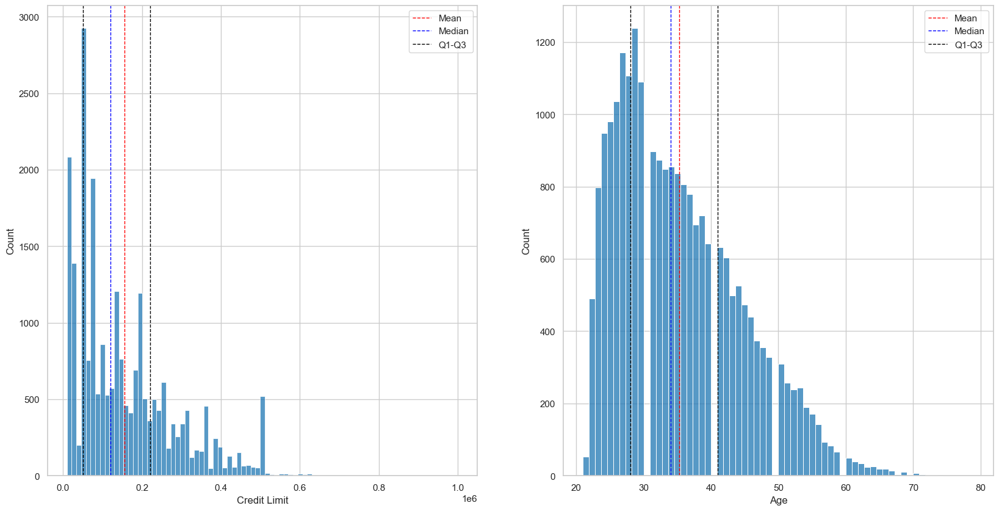

In [168]:
def plot_histogram_with_stats(column: str, hide_outliers = False) -> None:
    """Plot histogram with mean, median, Q1-Q3."""

    sns.histplot(
        data=processed_df,
        x=column,
        binrange=(processed_df[column].quantile(0.05), processed_df[column].quantile(0.95)) if hide_outliers else None,
    )

    plt.axvline(
        x=processed_df[column].mean(),
        color='red',
        linestyle='dashed',
        linewidth=1,
    )

    plt.axvline(
        x=processed_df[column].median(),
        color='blue',
        linestyle='dashed',
        linewidth=1,
    )

    plt.axvline(
        x=processed_df[column].quantile(0.25),
        color='black',
        linestyle='dashed',
        linewidth=1,
    )

    plt.axvline(
        x=processed_df[column].quantile(0.75),
        color='black',
        linestyle='dashed',
        linewidth=1,
    )
    
    plt.legend(['Mean', 'Median', 'Q1-Q3'])

plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plot_histogram_with_stats('Credit Limit')
plt.subplot(1, 2, 2)
plot_histogram_with_stats('Age')

**Las variables "Bill Amount" y "Amount Paid" están muy sesgadas debido a los valores atípicos. Sus medias se encuentran incluso por encima de su rango intercuartílico.**

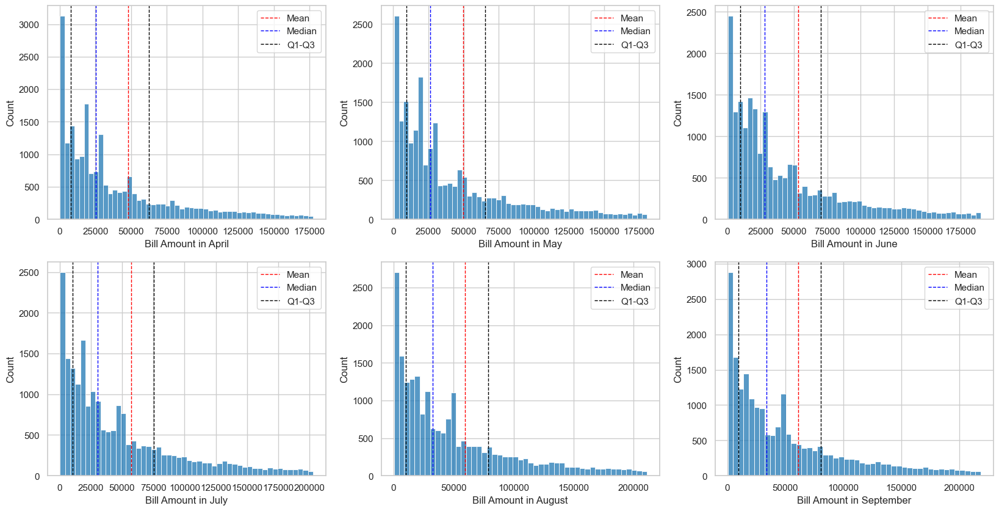

In [169]:
plt.figure(figsize=(20, 10))
plt.subplot(2, 3, 1)
plot_histogram_with_stats('Bill Amount in April', hide_outliers=True)
plt.subplot(2, 3, 2)
plot_histogram_with_stats('Bill Amount in May', hide_outliers=True)
plt.subplot(2, 3, 3)
plot_histogram_with_stats('Bill Amount in June', hide_outliers=True)
plt.subplot(2, 3, 4)
plot_histogram_with_stats('Bill Amount in July', hide_outliers=True)
plt.subplot(2, 3, 5)
plot_histogram_with_stats('Bill Amount in August', hide_outliers=True)
plt.subplot(2, 3, 6)
plot_histogram_with_stats('Bill Amount in September', hide_outliers=True)

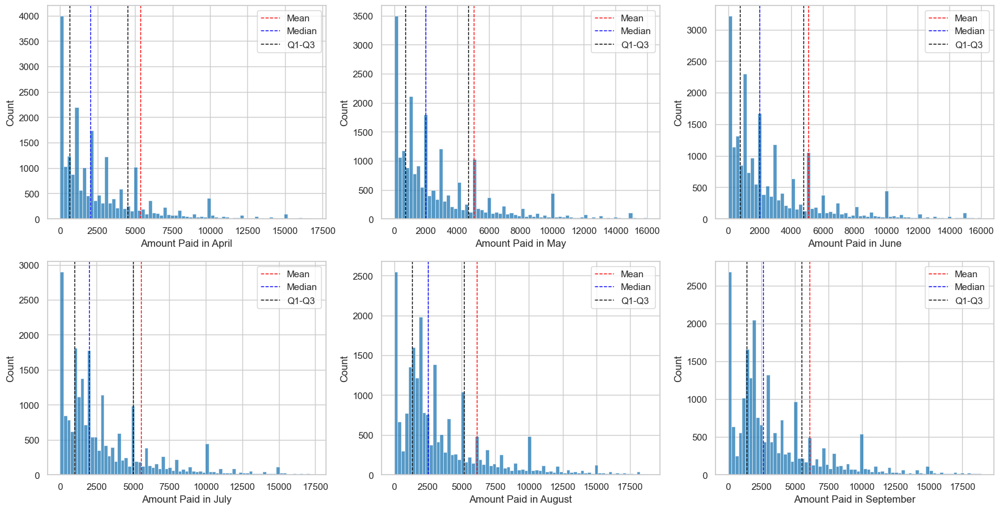

In [170]:
plt.figure(figsize=(20, 10))
plt.subplot(2, 3, 1)
plot_histogram_with_stats('Amount Paid in April', hide_outliers=True)
plt.subplot(2, 3, 2)
plot_histogram_with_stats('Amount Paid in May', hide_outliers=True)
plt.subplot(2, 3, 3)
plot_histogram_with_stats('Amount Paid in June', hide_outliers=True)
plt.subplot(2, 3, 4)
plot_histogram_with_stats('Amount Paid in July', hide_outliers=True)
plt.subplot(2, 3, 5)
plot_histogram_with_stats('Amount Paid in August', hide_outliers=True)
plt.subplot(2, 3, 6)
plot_histogram_with_stats('Amount Paid in September', hide_outliers=True)

### Diagramas de cajas

<Axes: xlabel='Age ', ylabel='Age'>

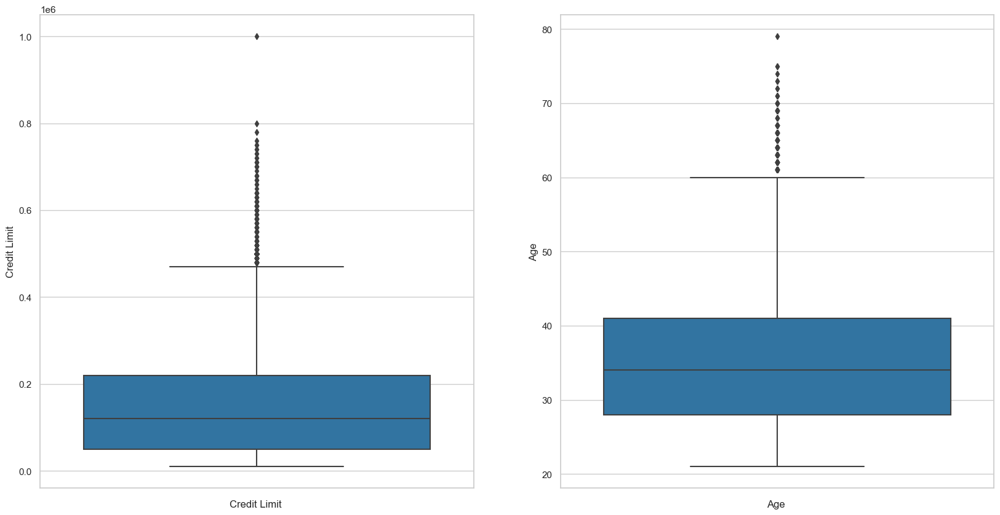

In [171]:
def plot_column_boxplot(column: str, label: str, hide_outliers = False) -> None:
    assert column != label, "Column and label must be different."
    return (
        processed_df
        .add_column(label, '')
        .pipe(
            lambda df: (
                sns.boxplot(
                    data=df[df[column].between(df[column].quantile(0.05), df[column].quantile(0.95))] if hide_outliers else df,
                    x=label,
                    y=column,
                    ax=plt.gca(),
                )
            )
        )
    )

plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plot_column_boxplot('Credit Limit', 'Credit Limit ', hide_outliers=False)
plt.subplot(1, 2, 2)
plot_column_boxplot('Age', 'Age ', hide_outliers=False)

Text(0.5, 0.98, 'Bill Amount')

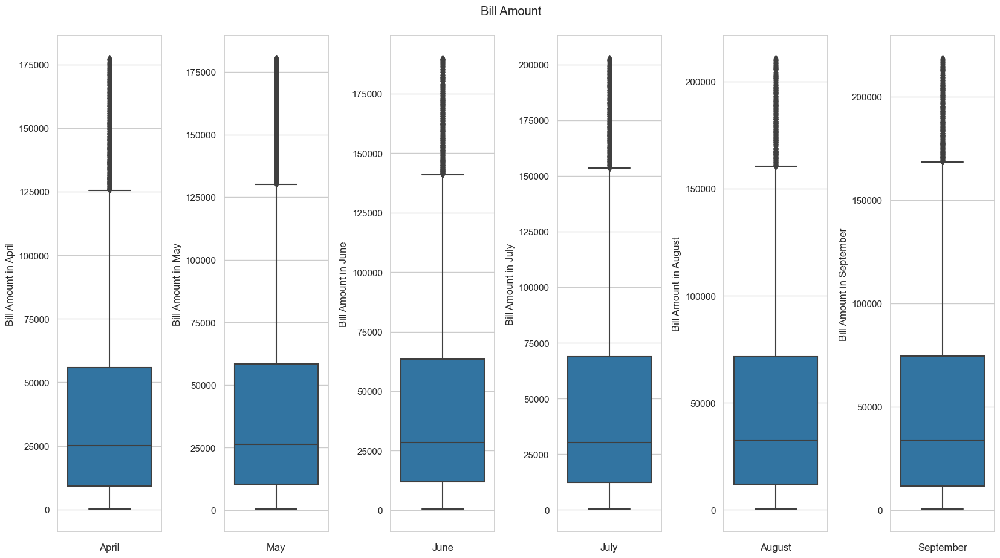

In [172]:
plt.figure(figsize=(20, 10))
plt.tight_layout()
plt.subplots_adjust(wspace=0.6, top=0.93)
plt.subplot(1, 6, 1)
plot_column_boxplot('Bill Amount in April', 'April', hide_outliers=True)
plt.subplot(1, 6, 2)
plot_column_boxplot('Bill Amount in May', 'May', hide_outliers=True)
plt.subplot(1, 6, 3)
plot_column_boxplot('Bill Amount in June', 'June', hide_outliers=True)
plt.subplot(1, 6, 4)
plot_column_boxplot('Bill Amount in July', 'July', hide_outliers=True)
plt.subplot(1, 6, 5)
plot_column_boxplot('Bill Amount in August', 'August', hide_outliers=True)
plt.subplot(1, 6, 6)
plot_column_boxplot('Bill Amount in September', 'September', hide_outliers=True)
plt.suptitle('Bill Amount')

Text(0.5, 0.98, 'Amount Paid')

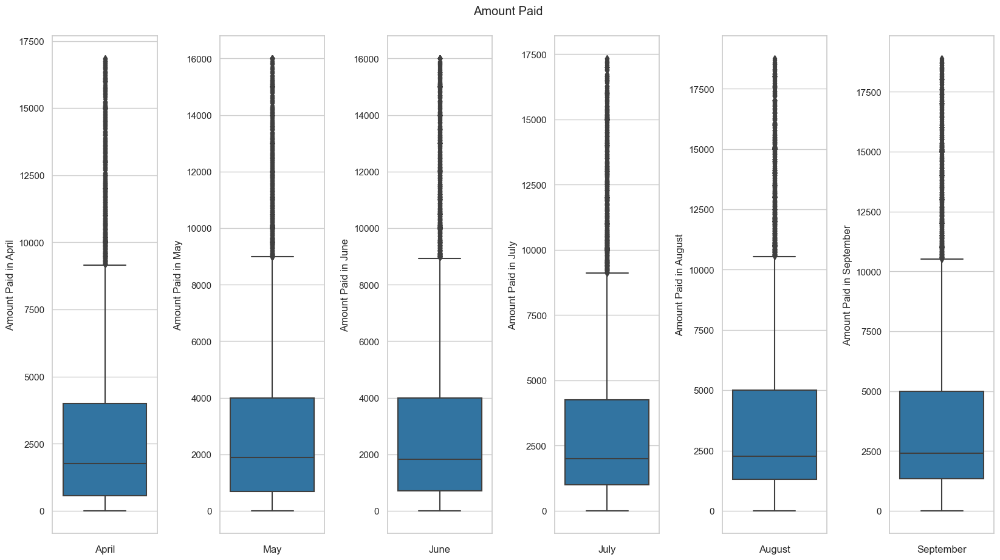

In [173]:
plt.figure(figsize=(20, 10))
plt.tight_layout()
plt.subplots_adjust(wspace=0.6, top=0.93)
plt.subplot(1, 6, 1)
plot_column_boxplot('Amount Paid in April', 'April', hide_outliers=True)
plt.subplot(1, 6, 2)
plot_column_boxplot('Amount Paid in May', 'May', hide_outliers=True)
plt.subplot(1, 6, 3)
plot_column_boxplot('Amount Paid in June', 'June', hide_outliers=True)
plt.subplot(1, 6, 4)
plot_column_boxplot('Amount Paid in July', 'July', hide_outliers=True)
plt.subplot(1, 6, 5)
plot_column_boxplot('Amount Paid in August', 'August', hide_outliers=True)
plt.subplot(1, 6, 6)
plot_column_boxplot('Amount Paid in September', 'September', hide_outliers=True)
plt.suptitle('Amount Paid')

### Funciones empíricas de masas de probabilidad (PMFs)

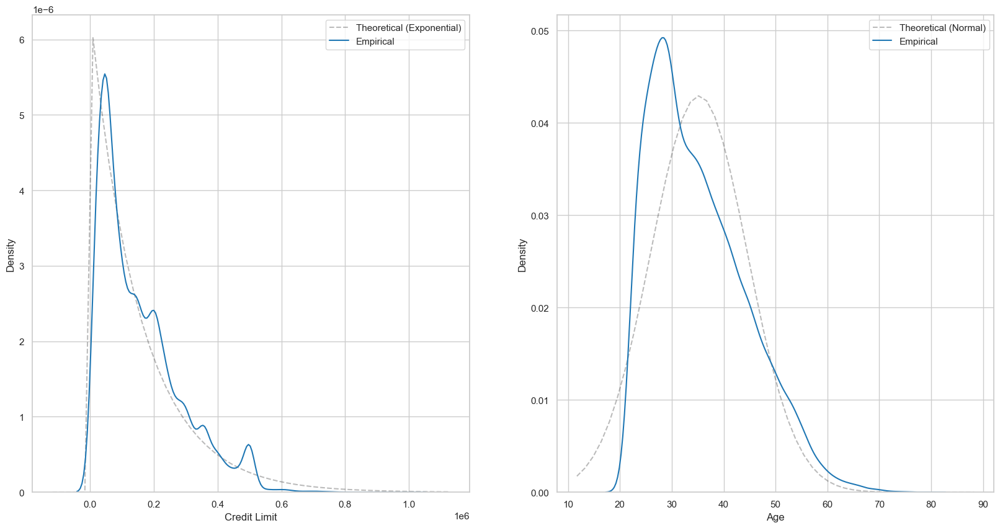

In [174]:
def plot_empirical_pmf(column: str, distr_type: str, hide_outliers = False) -> None:
    df = processed_df[processed_df[column].between(processed_df[column].quantile(0.05), processed_df[column].quantile(0.95))] if hide_outliers else processed_df
    stats = df[column].describe()
    match distr_type:
        case 'Normal':
            distr = scipy.stats.norm(stats['mean'], stats['std']).pdf
            xs = np.linspace(stats['min'] - stats['std'], stats['max'] + stats['std'])
        case 'Exponential':
            distr = scipy.stats.expon(scale=stats['mean']).pdf
            xs = np.linspace(stats['min'] - stats['std'], stats['max'] + stats['std'])
        case 'Uniform':
            distr = scipy.stats.uniform(stats['min'], stats['max'] - stats['min']).pdf
            xs = np.linspace(stats['min'] - stats['std'], stats['max'] + stats['std'])
        case 'Binomial':
            distr = scipy.stats.binom(stats['max'], stats['mean'] / stats['max']).pmf
            xs = np.arange(stats['min'], stats['max'])
        case 'Poisson':
            distr = scipy.stats.poisson(stats['mean']).pmf
            xs = np.arange(stats['min'], stats['max'])

    ys = distr(xs)
    plt.plot(xs, ys, color='#00000044', linestyle='dashed')

    sns.kdeplot(
        data=df,
        x=column
    )

    plt.legend([f'Theoretical ({distr_type})', 'Empirical'])


plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plot_empirical_pmf('Credit Limit', 'Exponential', hide_outliers=False)
plt.subplot(1, 2, 2)
plot_empirical_pmf('Age', 'Normal', hide_outliers=False)

Text(0.5, 0.98, 'Bill Amount')

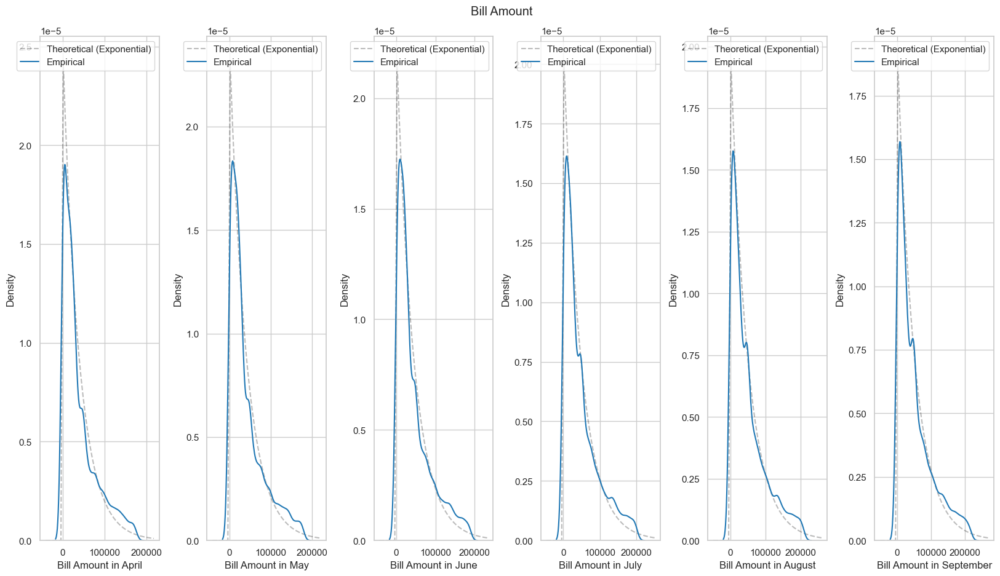

In [175]:
plt.figure(figsize=(20, 10))
plt.tight_layout()
plt.subplots_adjust(wspace=0.4, top=0.93)
plt.subplot(1, 6, 1)
plot_empirical_pmf('Bill Amount in April', 'Exponential', hide_outliers=True)
plt.subplot(1, 6, 2)
plot_empirical_pmf('Bill Amount in May', 'Exponential', hide_outliers=True)
plt.subplot(1, 6, 3)
plot_empirical_pmf('Bill Amount in June', 'Exponential', hide_outliers=True)
plt.subplot(1, 6, 4)
plot_empirical_pmf('Bill Amount in July', 'Exponential', hide_outliers=True)
plt.subplot(1, 6, 5)
plot_empirical_pmf('Bill Amount in August', 'Exponential', hide_outliers=True)
plt.subplot(1, 6, 6)
plot_empirical_pmf('Bill Amount in September', 'Exponential', hide_outliers=True)
plt.suptitle('Bill Amount')

Text(0.5, 0.98, 'Amount Paid')

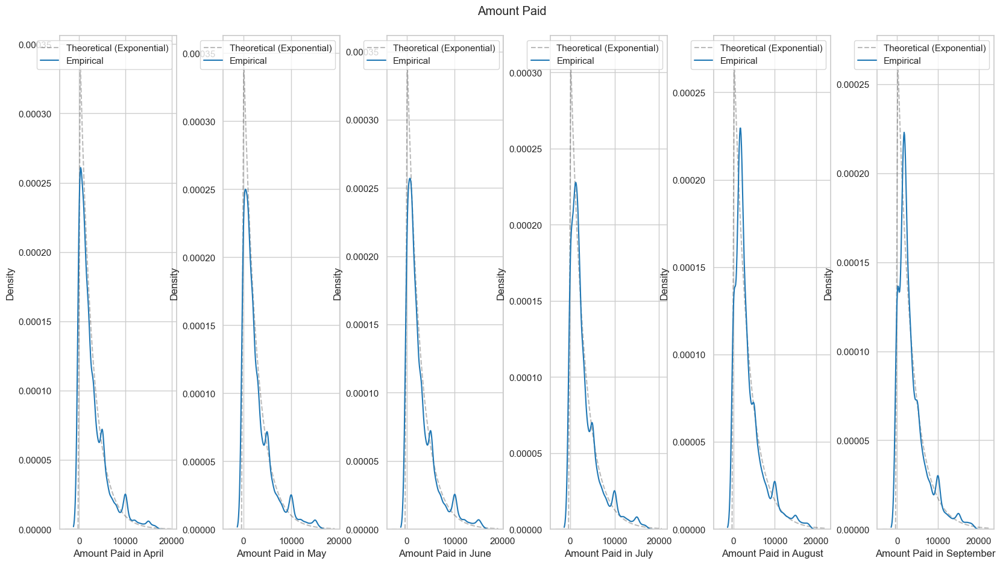

In [176]:
plt.figure(figsize=(20, 10))
plt.tight_layout()
plt.subplots_adjust(wspace=0.4, top=0.93)
plt.subplot(1, 6, 1)
plot_empirical_pmf('Amount Paid in April', 'Exponential', hide_outliers=True)
plt.subplot(1, 6, 2)
plot_empirical_pmf('Amount Paid in May', 'Exponential', hide_outliers=True)
plt.subplot(1, 6, 3)
plot_empirical_pmf('Amount Paid in June', 'Exponential', hide_outliers=True)
plt.subplot(1, 6, 4)
plot_empirical_pmf('Amount Paid in July', 'Exponential', hide_outliers=True)
plt.subplot(1, 6, 5)
plot_empirical_pmf('Amount Paid in August', 'Exponential', hide_outliers=True)
plt.subplot(1, 6, 6)
plot_empirical_pmf('Amount Paid in September', 'Exponential', hide_outliers=True)
plt.suptitle('Amount Paid')

### Funciones empirícas de probabilidad acumulada (CDFs)

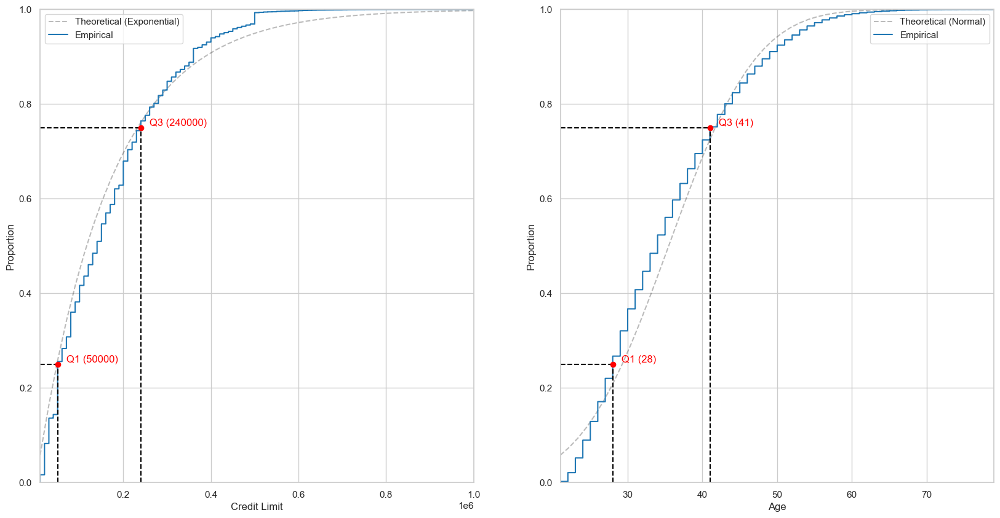

In [177]:
def plot_empirical_cdf(column: str, distr_type: str, hide_outliers = False, highlight_quartiles = False) -> None:
    np.random.seed(42)
    df = numeric_df[numeric_df[column].between(numeric_df[column].quantile(0.05), numeric_df[column].quantile(0.95))] if hide_outliers else numeric_df
    stats = df[column].describe()
    match distr_type:
        case 'Normal':
            distr = scipy.stats.norm(stats['mean'], stats['std']).cdf
            xs = np.linspace(stats['min'], stats['max'])
        case 'Exponential':
            distr = scipy.stats.expon(scale=stats['mean']).cdf
            xs = np.linspace(stats['min'], stats['max'])
        case 'Uniform':
            distr = scipy.stats.uniform(stats['min'], stats['max'] - stats['min']).cdf
            xs = np.linspace(stats['min'], stats['max'])
        case 'Binomial':
            distr = scipy.stats.binom(stats['max'], stats['mean'] / stats['max']).cdf
            xs = np.arange(stats['min'], stats['max'])
        case 'Poisson':
            distr = scipy.stats.poisson(stats['mean']).cdf
            xs = np.arange(stats['min'], stats['max'])
        case _:
            distr = None
            xs = None

    if distr is not None and xs is not None:
        ys = distr(xs)
        plt.plot(xs, ys, color='#00000044', linestyle='dashed')

    empirical_cdf = empiricaldist.Cdf.from_seq(
        df[column],
        normalize=True
    )

    empirical_pmf = empiricaldist.Pmf.from_seq(
        df[column],
        normalize=True
    )
    
    sns.ecdfplot(
        data=df,
        x=column,
    )

    if highlight_quartiles:

        ps = [0.25, 0.75]
        qs = empirical_cdf.inverse(ps)

        plt.vlines(
            x=qs,
            ymin=0,
            ymax=ps,
            color = 'black',
            linestyle='dashed'
        )

        plt.hlines(
            y=ps,
            xmin=empirical_pmf.qs[0],
            xmax=qs,
            color='black',
            linestyle='dashed'
        )

        plt.scatter(
            x=qs,
            y=ps,
            color='red',
            zorder=2
        )

        plt.text(
            x=qs[0],
            y=ps[0],
            s=(' '*3) + f'Q1 ({qs[0]:.0f})',
            ha='left',
            va='bottom',
            color='red'
        )

        plt.text(
            x=qs[1],
            y=ps[1],
            s=(' '*3) + f'Q3 ({qs[1]:.0f})',
            ha='left',
            va='bottom',
            color='red'
        )

        plt.xlim(empirical_pmf.qs[0], empirical_pmf.qs[-1])
        plt.ylim(0, 1)

    plt.legend([f'Theoretical ({distr_type})', 'Empirical'])


plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plot_empirical_cdf('Credit Limit', 'Exponential', hide_outliers=False, highlight_quartiles=True)
plt.subplot(1, 2, 2)
plot_empirical_cdf('Age', 'Normal', hide_outliers=False, highlight_quartiles=True)

Text(0.5, 0.98, 'Bill Amount')

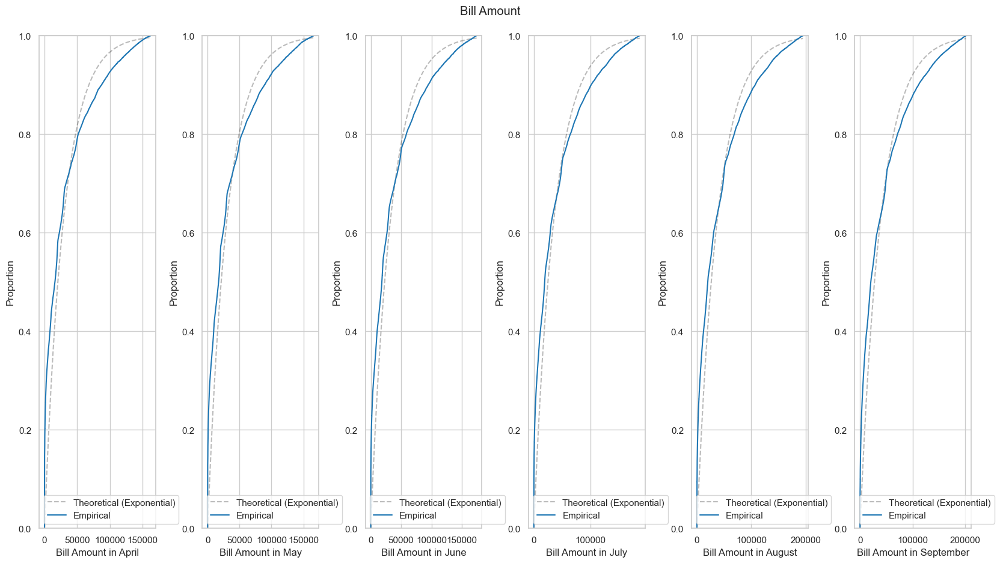

In [178]:
plt.figure(figsize=(20, 10))
plt.tight_layout()
plt.subplots_adjust(wspace=0.4, top=0.93)
plt.subplot(1, 6, 1)
plot_empirical_cdf('Bill Amount in April', 'Exponential', hide_outliers=True, highlight_quartiles=False)
plt.subplot(1, 6, 2)
plot_empirical_cdf('Bill Amount in May', 'Exponential', hide_outliers=True, highlight_quartiles=False)
plt.subplot(1, 6, 3)
plot_empirical_cdf('Bill Amount in June', 'Exponential', hide_outliers=True, highlight_quartiles=False)
plt.subplot(1, 6, 4)
plot_empirical_cdf('Bill Amount in July', 'Exponential', hide_outliers=True, highlight_quartiles=False)
plt.subplot(1, 6, 5)
plot_empirical_cdf('Bill Amount in August', 'Exponential', hide_outliers=True, highlight_quartiles=False)
plt.subplot(1, 6, 6)
plot_empirical_cdf('Bill Amount in September', 'Exponential', hide_outliers=True, highlight_quartiles=False)
plt.suptitle('Bill Amount')

Text(0.5, 0.98, 'Amount Paid')

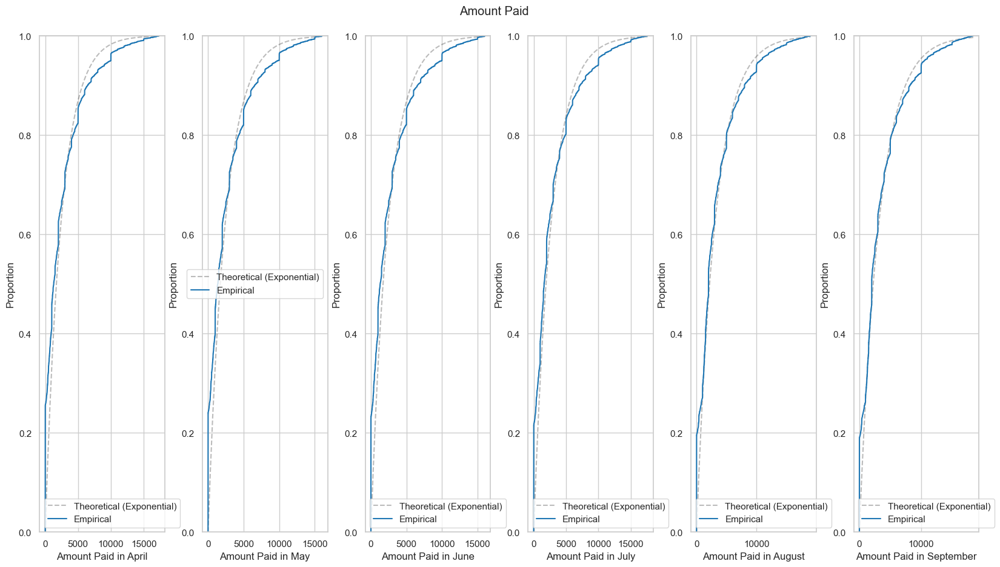

In [179]:
plt.figure(figsize=(20, 10))
plt.tight_layout()
plt.subplots_adjust(wspace=0.3, top=0.93)
plt.subplot(1, 6, 1)
plot_empirical_cdf('Amount Paid in April', 'Exponential', hide_outliers=True, highlight_quartiles=False)
plt.subplot(1, 6, 2)
plot_empirical_cdf('Amount Paid in May', 'Exponential', hide_outliers=True, highlight_quartiles=False)
plt.subplot(1, 6, 3)
plot_empirical_cdf('Amount Paid in June', 'Exponential', hide_outliers=True, highlight_quartiles=False)
plt.subplot(1, 6, 4)
plot_empirical_cdf('Amount Paid in July', 'Exponential', hide_outliers=True, highlight_quartiles=False)
plt.subplot(1, 6, 5)
plot_empirical_cdf('Amount Paid in August', 'Exponential', hide_outliers=True, highlight_quartiles=False)
plt.subplot(1, 6, 6)
plot_empirical_cdf('Amount Paid in September', 'Exponential', hide_outliers=True, highlight_quartiles=False)
plt.suptitle('Amount Paid')

Text(0.5, 0.98, 'Payed Status')

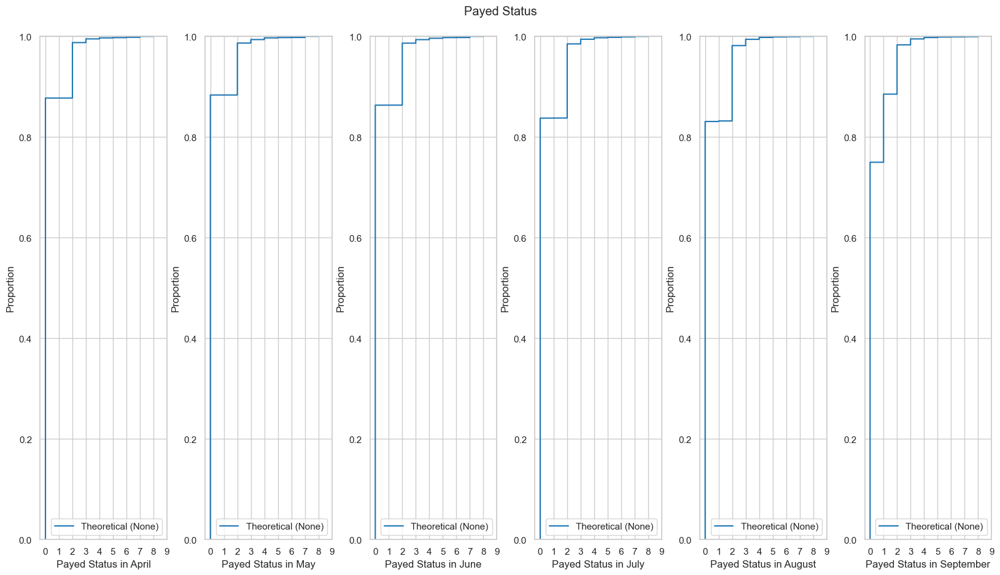

In [180]:
plt.figure(figsize=(20, 10))
plt.tight_layout()
plt.subplots_adjust(wspace=0.3, top=0.93)
plt.subplot(1, 6, 1)
plot_empirical_cdf('Payed Status in April', None, hide_outliers=False, highlight_quartiles=False)
plt.xticks(ticks=range(10))
plt.subplot(1, 6, 2)
plot_empirical_cdf('Payed Status in May', None, hide_outliers=False, highlight_quartiles=False)
plt.xticks(ticks=range(10))
plt.subplot(1, 6, 3)
plot_empirical_cdf('Payed Status in June', None, hide_outliers=False, highlight_quartiles=False)
plt.xticks(ticks=range(10))
plt.subplot(1, 6, 4)
plot_empirical_cdf('Payed Status in July', None, hide_outliers=False, highlight_quartiles=False)
plt.xticks(ticks=range(10))
plt.subplot(1, 6, 5)
plot_empirical_cdf('Payed Status in August', None, hide_outliers=False, highlight_quartiles=False)
plt.xticks(ticks=range(10))
plt.subplot(1, 6, 6)
plot_empirical_cdf('Payed Status in September', None, hide_outliers=False, highlight_quartiles=False)
plt.xticks(ticks=range(10))
plt.suptitle('Payed Status')

### Distribuciones según default behavior

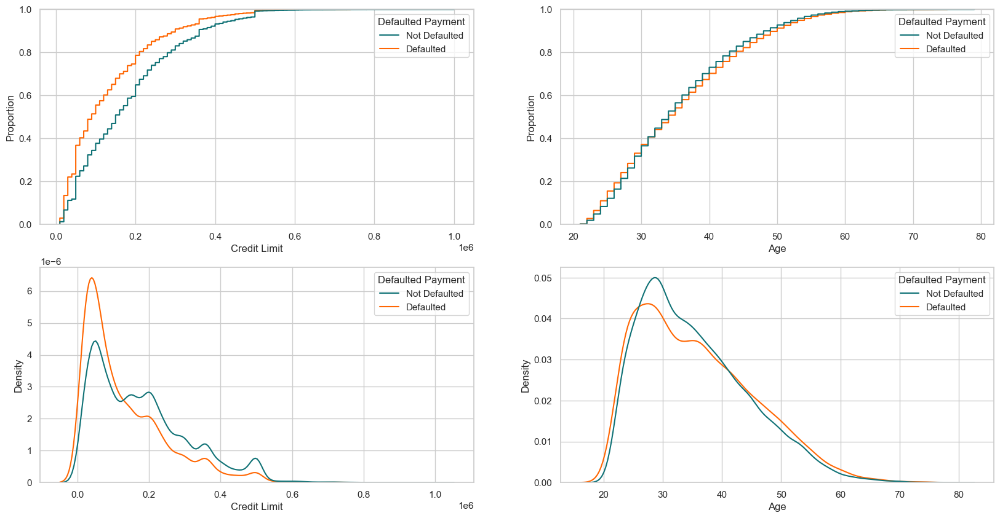

In [181]:
def plot_pmf_by_default_behavior(column: str, hide_outliers = False) -> None:
    sns.kdeplot(
        data=numeric_df if not hide_outliers else numeric_df[numeric_df[column].between(numeric_df[column].quantile(0.05), numeric_df[column].quantile(0.95))],
        x=column,
        hue='Defaulted Payment',
        palette=defaulted_color,
        common_norm=False,
    )

def plot_cdf_by_default_behavior(column: str, hide_outliers = False) -> None:
    sns.ecdfplot(
        data=numeric_df if not hide_outliers else numeric_df[numeric_df[column].between(numeric_df[column].quantile(0.05), numeric_df[column].quantile(0.95))],
        x=column,
        hue='Defaulted Payment',
        palette=defaulted_color
    )

plt.figure(figsize=(20, 10))
plt.subplot(2, 2, 1)
plot_cdf_by_default_behavior('Credit Limit', hide_outliers=False)
plt.subplot(2, 2, 2)
plot_cdf_by_default_behavior('Age', hide_outliers=False)
plt.subplot(2, 2, 3)
plot_pmf_by_default_behavior('Credit Limit', hide_outliers=False)
plt.subplot(2, 2, 4)
plot_pmf_by_default_behavior('Age', hide_outliers=False)

Text(0.5, 0.98, 'Bill Amount')

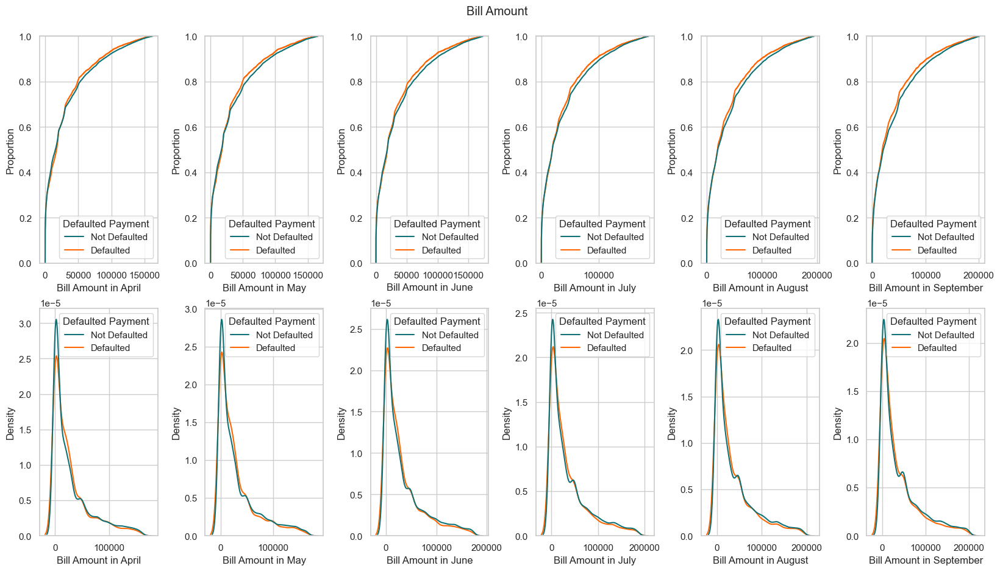

In [182]:
plt.figure(figsize=(20, 10))
plt.tight_layout()
plt.subplots_adjust(wspace=0.4, top=0.93)
plt.subplot(2, 6, 1)
plot_cdf_by_default_behavior('Bill Amount in April', hide_outliers=True)
plt.subplot(2, 6, 2)
plot_cdf_by_default_behavior('Bill Amount in May', hide_outliers=True)
plt.subplot(2, 6, 3)
plot_cdf_by_default_behavior('Bill Amount in June', hide_outliers=True)
plt.subplot(2, 6, 4)
plot_cdf_by_default_behavior('Bill Amount in July', hide_outliers=True)
plt.subplot(2, 6, 5)
plot_cdf_by_default_behavior('Bill Amount in August', hide_outliers=True)
plt.subplot(2, 6, 6)
plot_cdf_by_default_behavior('Bill Amount in September', hide_outliers=True)
plt.subplot(2, 6, 7)
plot_pmf_by_default_behavior('Bill Amount in April', hide_outliers=True)
plt.subplot(2, 6, 8)
plot_pmf_by_default_behavior('Bill Amount in May', hide_outliers=True)
plt.subplot(2, 6, 9)
plot_pmf_by_default_behavior('Bill Amount in June', hide_outliers=True)
plt.subplot(2, 6, 10)
plot_pmf_by_default_behavior('Bill Amount in July', hide_outliers=True)
plt.subplot(2, 6, 11)
plot_pmf_by_default_behavior('Bill Amount in August', hide_outliers=True)
plt.subplot(2, 6, 12)
plot_pmf_by_default_behavior('Bill Amount in September', hide_outliers=True)
plt.suptitle('Bill Amount')

Text(0.5, 0.98, 'Amount Paid')

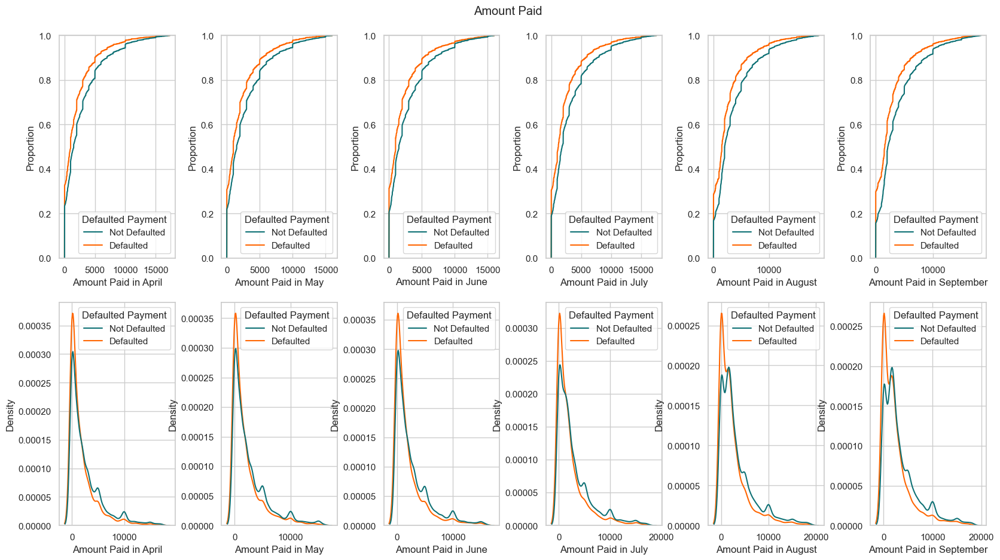

In [183]:
plt.figure(figsize=(20, 10))
plt.tight_layout()
plt.subplots_adjust(wspace=0.4, top=0.93)
plt.subplot(2, 6, 1)
plot_cdf_by_default_behavior('Amount Paid in April', hide_outliers=True)
plt.subplot(2, 6, 2)
plot_cdf_by_default_behavior('Amount Paid in May', hide_outliers=True)
plt.subplot(2, 6, 3)
plot_cdf_by_default_behavior('Amount Paid in June', hide_outliers=True)
plt.subplot(2, 6, 4)
plot_cdf_by_default_behavior('Amount Paid in July', hide_outliers=True)
plt.subplot(2, 6, 5)
plot_cdf_by_default_behavior('Amount Paid in August', hide_outliers=True)
plt.subplot(2, 6, 6)
plot_cdf_by_default_behavior('Amount Paid in September', hide_outliers=True)
plt.subplot(2, 6, 7)
plot_pmf_by_default_behavior('Amount Paid in April', hide_outliers=True)
plt.subplot(2, 6, 8)
plot_pmf_by_default_behavior('Amount Paid in May', hide_outliers=True)
plt.subplot(2, 6, 9)
plot_pmf_by_default_behavior('Amount Paid in June', hide_outliers=True)
plt.subplot(2, 6, 10)
plot_pmf_by_default_behavior('Amount Paid in July', hide_outliers=True)
plt.subplot(2, 6, 11)
plot_pmf_by_default_behavior('Amount Paid in August', hide_outliers=True)
plt.subplot(2, 6, 12)
plot_pmf_by_default_behavior('Amount Paid in September', hide_outliers=True)
plt.suptitle('Amount Paid')

Text(0.5, 0.98, 'Payed Status')

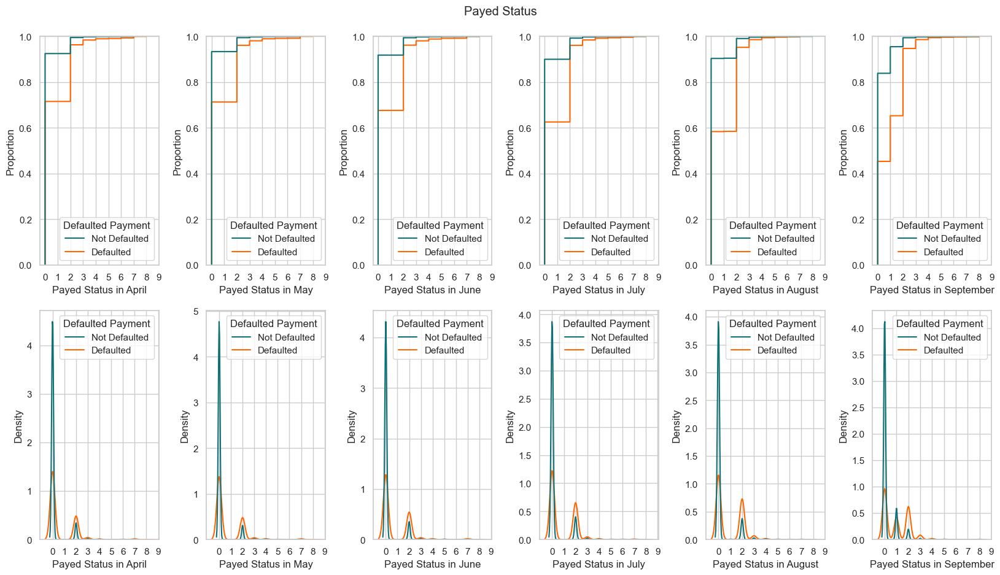

In [184]:
plt.figure(figsize=(20, 10))
plt.tight_layout()
plt.subplots_adjust(wspace=0.4, top=0.93)
plt.subplot(2, 6, 1)
plot_cdf_by_default_behavior('Payed Status in April', hide_outliers=False)
plt.xticks(ticks=range(10))
plt.subplot(2, 6, 2)
plot_cdf_by_default_behavior('Payed Status in May', hide_outliers=False)
plt.xticks(ticks=range(10))
plt.subplot(2, 6, 3)
plot_cdf_by_default_behavior('Payed Status in June', hide_outliers=False)
plt.xticks(ticks=range(10))
plt.subplot(2, 6, 4)
plot_cdf_by_default_behavior('Payed Status in July', hide_outliers=False)
plt.xticks(ticks=range(10))
plt.subplot(2, 6, 5)
plot_cdf_by_default_behavior('Payed Status in August', hide_outliers=False)
plt.xticks(ticks=range(10))
plt.subplot(2, 6, 6)
plot_cdf_by_default_behavior('Payed Status in September', hide_outliers=False)
plt.xticks(ticks=range(10))
plt.subplot(2, 6, 7)
plot_pmf_by_default_behavior('Payed Status in April', hide_outliers=False)
plt.xticks(ticks=range(10))
plt.subplot(2, 6, 8)
plot_pmf_by_default_behavior('Payed Status in May', hide_outliers=False)
plt.xticks(ticks=range(10))
plt.subplot(2, 6, 9)
plot_pmf_by_default_behavior('Payed Status in June', hide_outliers=False)
plt.xticks(ticks=range(10))
plt.subplot(2, 6, 10)
plot_pmf_by_default_behavior('Payed Status in July', hide_outliers=False)
plt.xticks(ticks=range(10))
plt.subplot(2, 6, 11)
plot_pmf_by_default_behavior('Payed Status in August', hide_outliers=False)
plt.xticks(ticks=range(10))
plt.subplot(2, 6, 12)
plot_pmf_by_default_behavior('Payed Status in September', hide_outliers=False)
plt.xticks(ticks=range(10))
plt.suptitle('Payed Status')

## Matrices de correlación

### ¿Existe una correlación lineal entre alguna de nuestras variables?

In [185]:
processed_df.corr(numeric_only=True)

,Credit Limit,Age,Bill Amount in September,Bill Amount in August,Bill Amount in July,Bill Amount in June,Bill Amount in May,Bill Amount in April,Amount Paid in September,Amount Paid in August,Amount Paid in July,Amount Paid in June,Amount Paid in May,Amount Paid in April
Credit Limit,1.000000,0.123500,0.401205,0.395235,0.399863,0.406947,0.405660,0.395285,0.223196,0.223476,0.237088,0.226402,0.246167,0.240682
Age,0.123500,1.000000,0.080695,0.078205,0.078653,0.075462,0.072856,0.071029,0.026646,0.028978,0.032660,0.022073,0.023581,0.019536
Bill Amount in September,0.401205,0.080695,1.000000,0.959704,0.915607,0.876476,0.848159,0.820976,0.135822,0.115810,0.156431,0.168762,0.174736,0.187579
Bill Amount in August,0.395235,0.078205,0.959704,1.000000,0.945143,0.903782,0.873584,0.846078,0.266922,0.117469,0.155302,0.159660,0.169559,0.178549
Bill Amount in July,0.399863,0.078653,0.915607,0.945143,1.000000,0.941433,0.903579,0.868593,0.244427,0.267307,0.126183,0.149421,0.168369,0.194540
Bill Amount in June,0.406947,0.075462,0.876476,0.903782,0.941433,1.000000,0.945478,0.907849,0.232545,0.228494,0.283036,0.132706,0.165300,0.186311
Bill Amount in May,0.405660,0.072856,0.848159,0.873584,0.903579,0.945478,1.000000,0.950568,0.216064,0.197962,0.247815,0.275798,0.143626,0.172951
Bill Amount in April,0.395285,0.071029,0.820976,0.846078,0.868593,0.907849,0.950568,1.000000,0.198670,0.173696,0.230686,0.242935,0.294024,0.121175
Amount Paid in September,0.223196,0.026646,0.135822,0.266922,0.244427,0.232545,0.216064,0.198670,1.000000,0.359835,0.270388,0.217016,0.143363,0.159290
Amount Paid in August,0.223476,0.028978,0.115810,0.117469,0.267307,0.228494,0.197962,0.173696,0.359835,1.000000,0.285263,0.209693,0.136295,0.186085


### Mapa de calor de correlaciones

<Axes: >

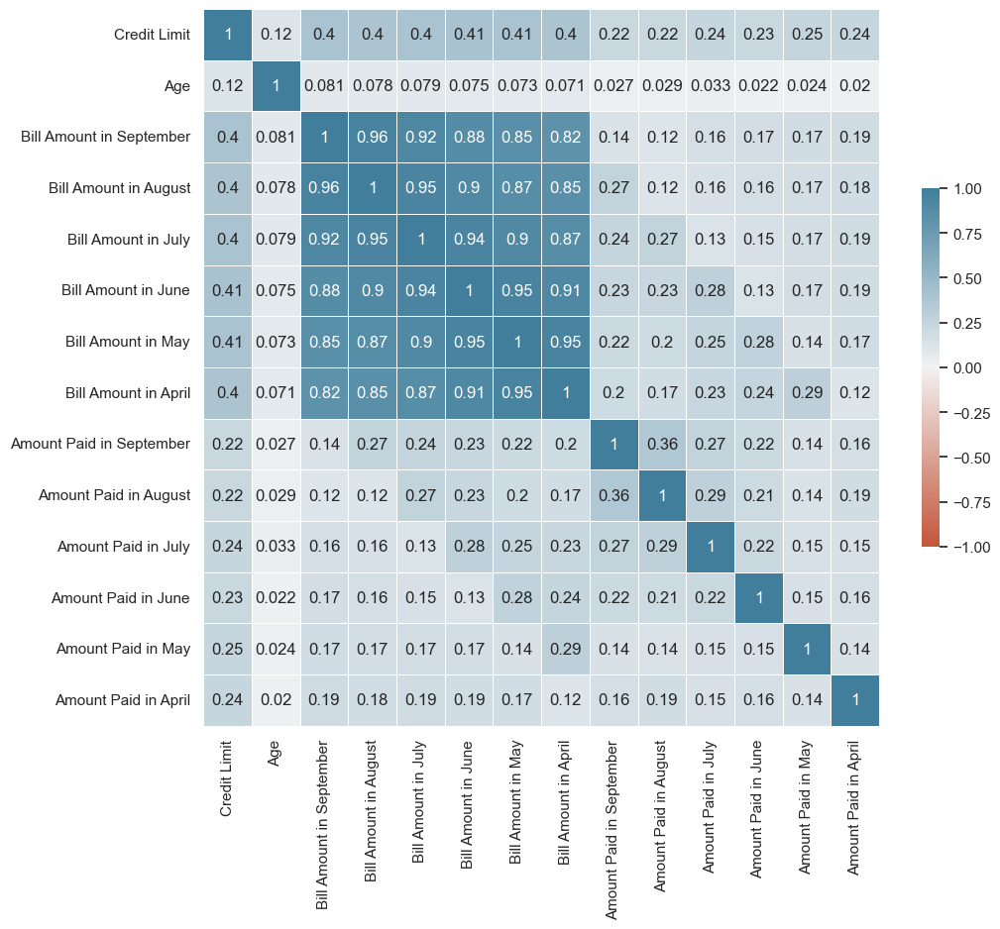

In [186]:
sns.heatmap(
    data=processed_df.corr(numeric_only=True),
    cmap=sns.diverging_palette(20, 230, as_cmap=True),
    center=0,
    vmin=-1,
    vmax=1,
    linewidths=0.5,
    cbar_kws={"shrink": 0.5},
    annot=True
)

### ¿Qué variables están más correlacionadas? Jerarquía de correlaciones

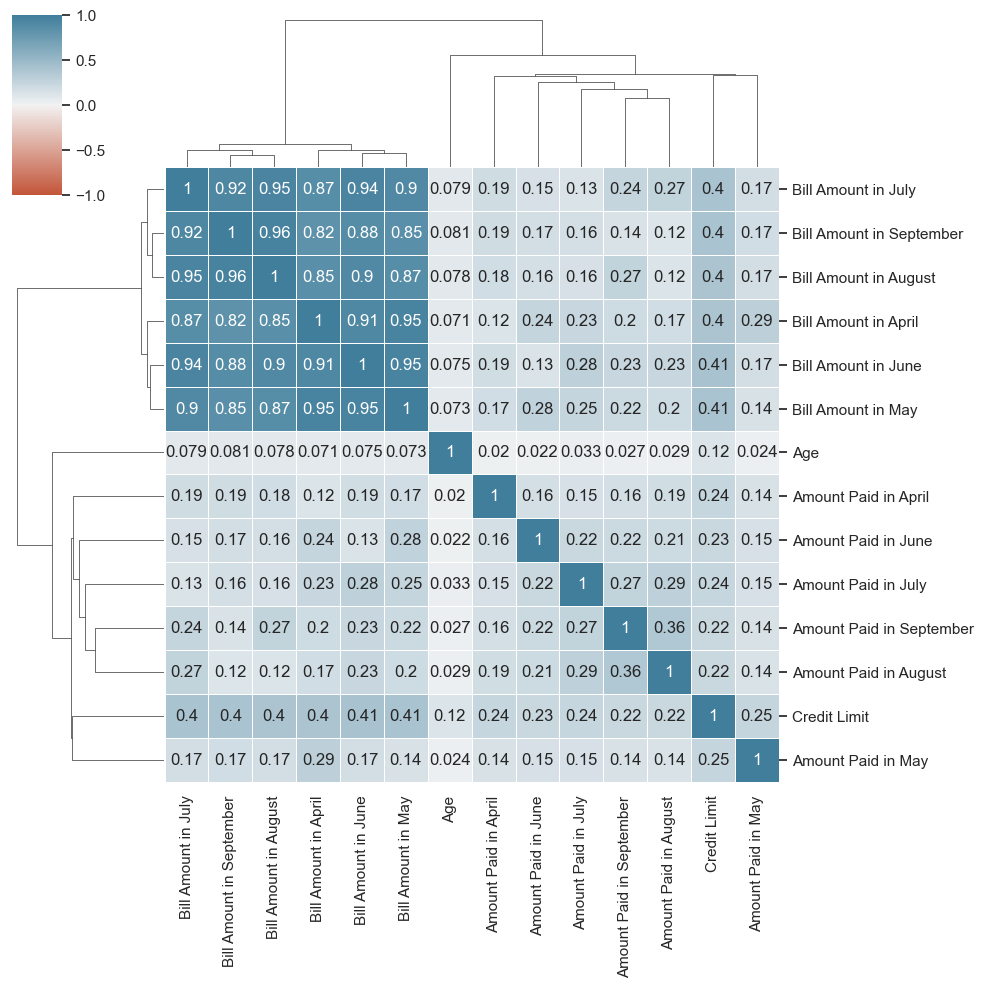

In [187]:
sns.clustermap(
    data=processed_df.corr(numeric_only=True),
    cmap=sns.diverging_palette(20, 230, as_cmap=True),
    center=0,
    vmin=-1,
    vmax=1,
    linewidths=0.5,
    cbar_kws={"shrink": 0.5},
    annot=True
)

### Incluir variables categóricas de forma numérica

<Axes: >

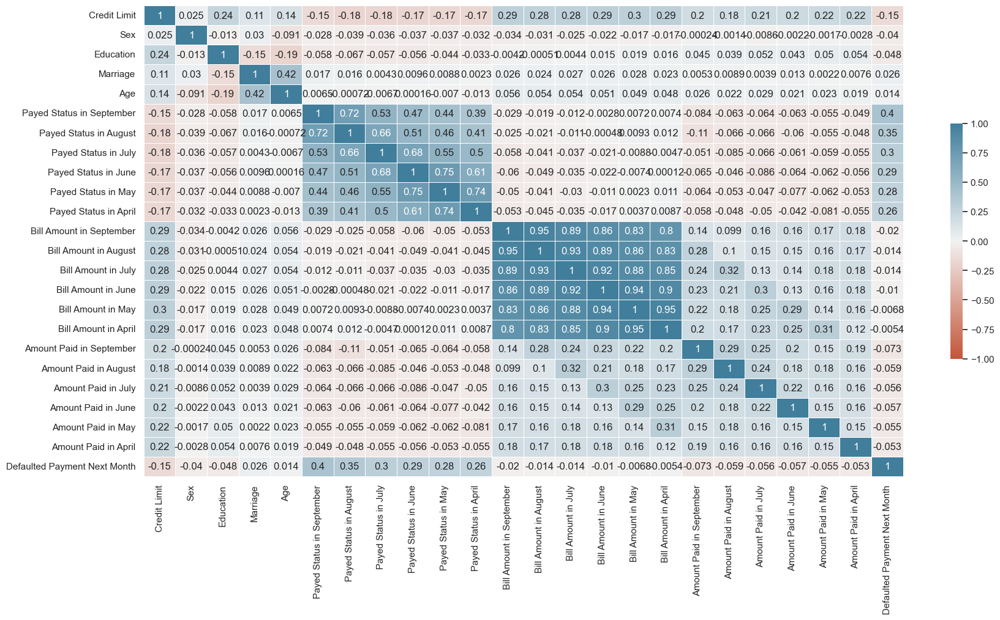

In [188]:
plt.figure(figsize=(20, 10))
sns.heatmap(
    data=numeric_df.corr(numeric_only=True),
    cmap=sns.diverging_palette(20, 230, as_cmap=True),
    center=0,
    vmin=-1,
    vmax=1,
    linewidths=0.5,
    cbar_kws={"shrink": 0.5},
    annot=True
)

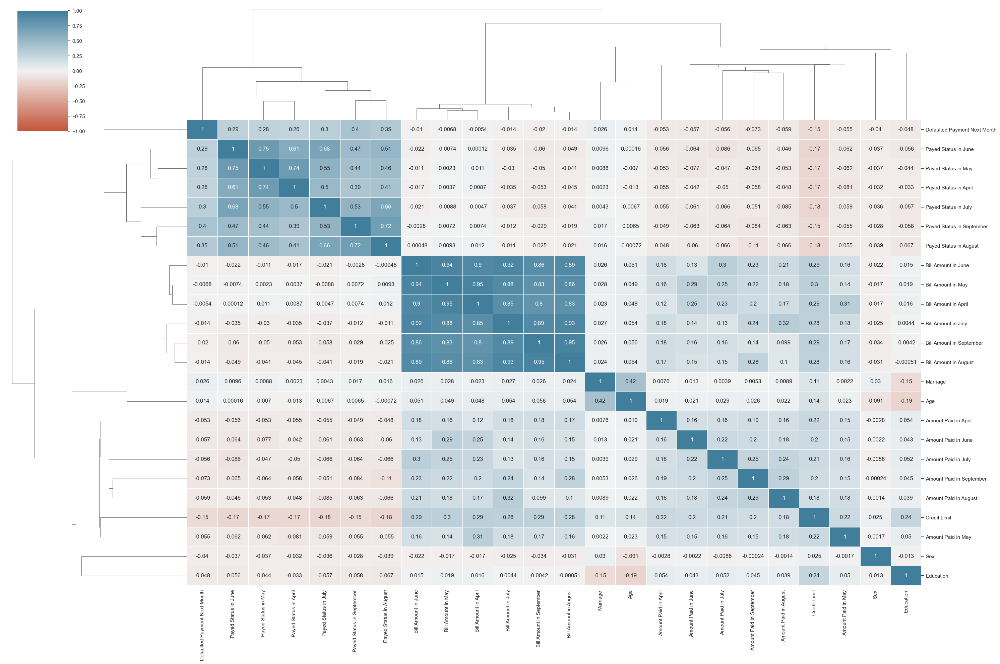

In [189]:

sns.clustermap(
    figsize=(30, 20),
    data=numeric_df.corr(numeric_only=True),
    cmap=sns.diverging_palette(20, 230, as_cmap=True),
    center=0,
    vmin=-1,
    vmax=1,
    linewidths=0.5,
    cbar_kws={"shrink": 0.5},
    annot=True
)

## Relaciones entre variables

### Gráfica de puntos

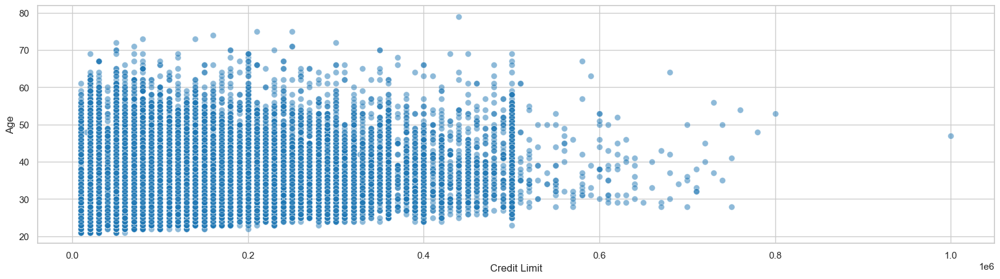

In [190]:
def plot_scatter_between_numerics(x_column: str, y_column: str, kind: str) -> None:
    match kind:
        case 'scatter':
            sns.scatterplot(
                data=processed_df,
                x=x_column,
                y=y_column,
                alpha=1/2,
                s=50,
                ax=plt.gca(),
            )
        case 'area':
            sns.displot(
                aspect=2,
                height=5,
                data=processed_df,
                x=x_column,
                y=y_column,
                alpha=1/2,
                rug=True
            )
        case 'contour':
            sns.displot(
                aspect=2,
                height=5,
                data=processed_df,
                x=x_column,
                y=y_column,
                alpha=1/2,
                kind='kde',
                rug=True
            )
        case 'joint':
            sns.jointplot(
                height=5,
                data=processed_df,
                x=x_column,
                y=y_column,
                marginal_kws=dict(bins=25, fill=False)
            )
        case 'hex':
            sns.jointplot(
                height=5,
                data=processed_df,
                x=x_column,
                y=y_column,
                kind='hex'
            )
        case 'reg':
            sns.lmplot(
                height=5,
                data=processed_df,
                x=x_column,
                y=y_column,
                hue='Defaulted Payment Next Month',
                palette=defaulted_color,
                scatter_kws={'s': 10},
                aspect=2,
            )

plt.figure(figsize=(20, 5))
plot_scatter_between_numerics('Credit Limit', 'Age', 'scatter')

<Figure size 2000x500 with 0 Axes>

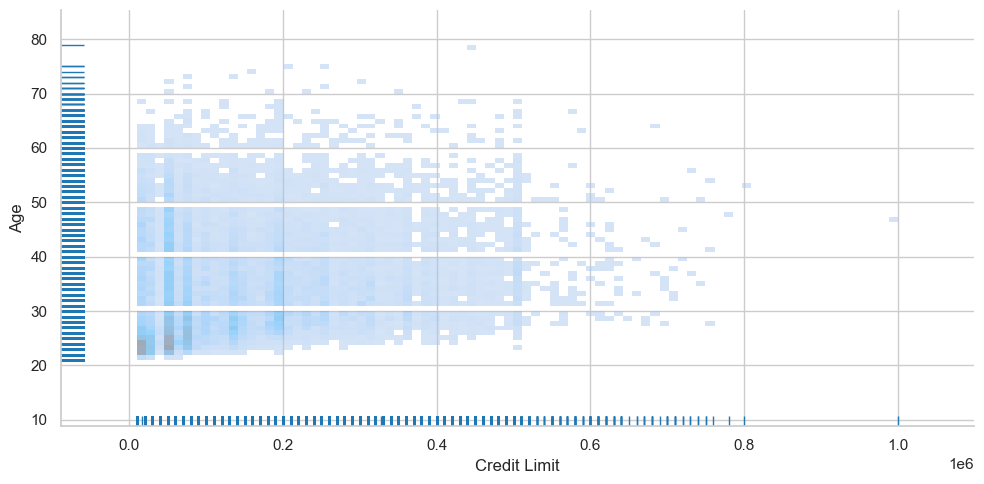

In [191]:
plt.figure(figsize=(20, 5))
plot_scatter_between_numerics('Credit Limit', 'Age', 'area')

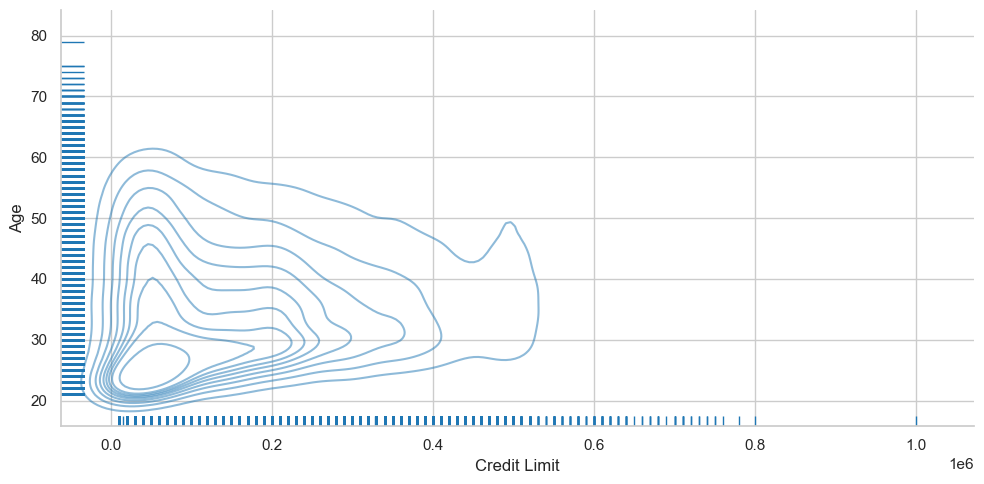

In [192]:
plot_scatter_between_numerics('Credit Limit', 'Age', 'contour')

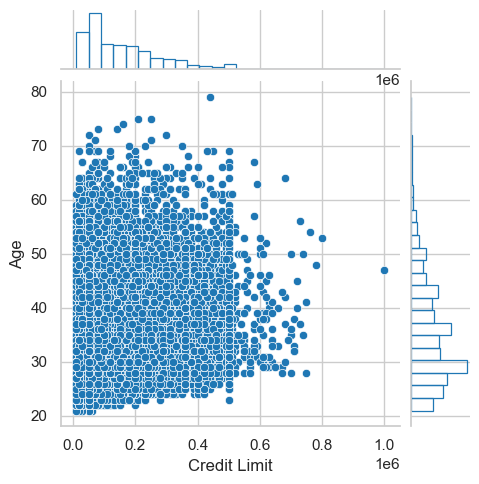

In [193]:
plot_scatter_between_numerics('Credit Limit', 'Age', 'joint')

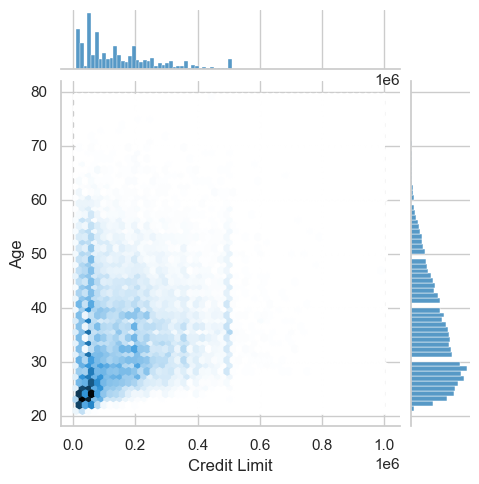

In [194]:
plot_scatter_between_numerics('Credit Limit', 'Age', 'hex')

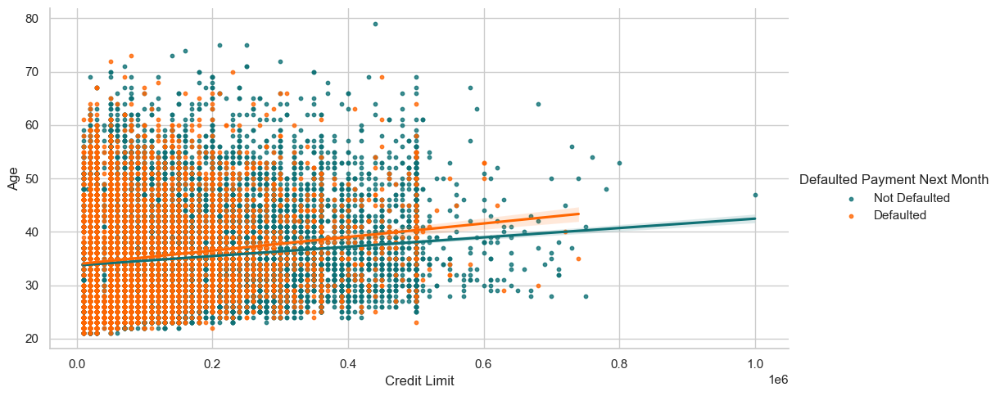

In [195]:
plot_scatter_between_numerics('Credit Limit', 'Age', 'reg')

### Gráficos de violín y boxplots

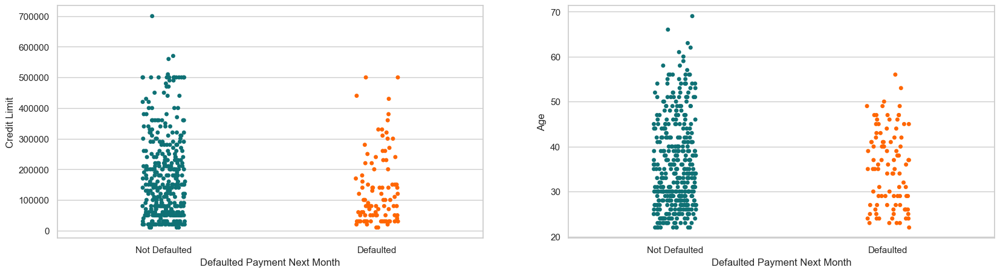

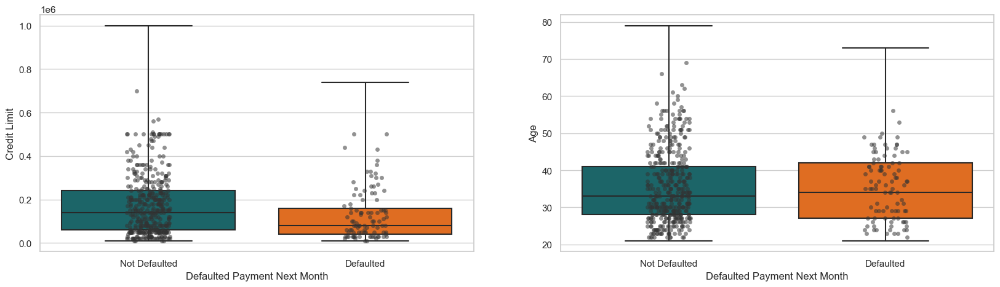

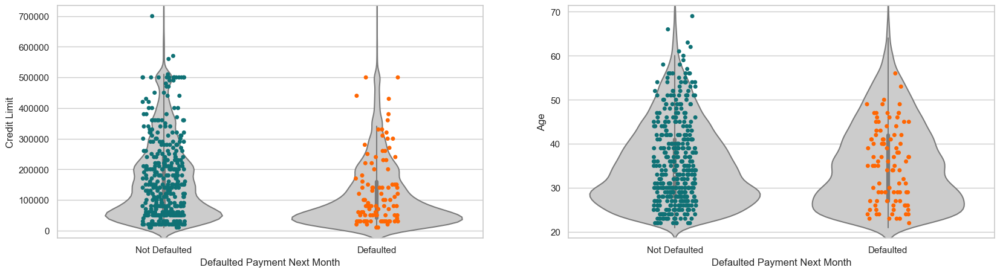

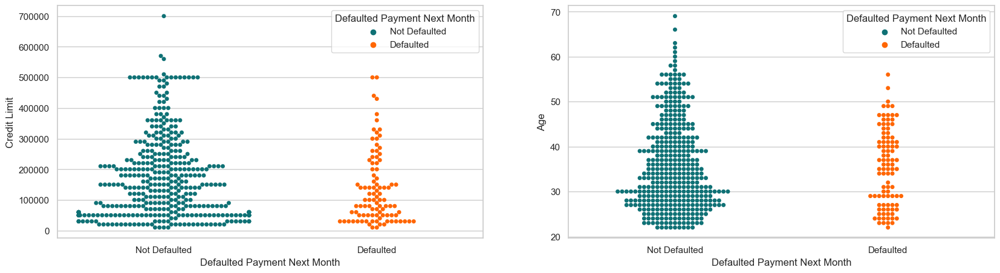

In [196]:
def plot_numeric_and_categorical(numeric_column: str, categorical_column: str, kind: str, palette: dict, sample_size: int, hide_outliers: bool = False) -> None:
    np.random.seed(42)
    df = processed_df[processed_df[numeric_column].between(processed_df[numeric_column].quantile(0.05), processed_df[numeric_column].quantile(0.95))] if hide_outliers else processed_df
    match kind:
        case 'strip':
            sns.stripplot(
                data=df.sample(sample_size),
                x=categorical_column,
                y=numeric_column,
                palette=palette,
                ax=plt.gca(),
            )
        case 'box':
            sns.boxplot(
                data=df,
                x=categorical_column,
                y=numeric_column,
                palette=palette,
                ax=plt.gca(),
                whis=np.inf
            )
            sns.stripplot(
                data=df.sample(sample_size),
                x=categorical_column,
                y=numeric_column,
                ax=plt.gca(),
                color='#33333388'
            )
        case 'violin':
            sns.violinplot(
                data=df,
                x=categorical_column,
                y=numeric_column,
                ax=plt.gca(),
                whis=np.inf,
                color='.8',
            )
            sns.stripplot(
                data=df.sample(sample_size),
                x=categorical_column,
                y=numeric_column,
                palette=palette,
                ax=plt.gca(),
            )
        case 'swarm':
            sns.swarmplot(
                data=df.sample(sample_size),
                x=categorical_column,
                y=numeric_column,
                hue=categorical_column,
                palette=palette,
                ax=plt.gca(),
            )

plt.figure(figsize=(20, 5))
plt.subplot(1, 2, 1)
plot_numeric_and_categorical('Credit Limit', 'Defaulted Payment Next Month', 'strip', defaulted_color, sample_size=500)
plt.subplot(1, 2, 2)
plot_numeric_and_categorical('Age', 'Defaulted Payment Next Month', 'strip', defaulted_color, sample_size=500)
plt.figure(figsize=(20, 5))
plt.subplot(1, 2, 1)
plot_numeric_and_categorical('Credit Limit', 'Defaulted Payment Next Month', 'box', defaulted_color, sample_size=500)
plt.subplot(1, 2, 2)
plot_numeric_and_categorical('Age', 'Defaulted Payment Next Month', 'box', defaulted_color, sample_size=500)
plt.figure(figsize=(20, 5))
plt.subplot(1, 2, 1)
plot_numeric_and_categorical('Credit Limit', 'Defaulted Payment Next Month', 'violin', defaulted_color, sample_size=500)
plt.subplot(1, 2, 2)
plot_numeric_and_categorical('Age', 'Defaulted Payment Next Month', 'violin', defaulted_color, sample_size=500)
plt.figure(figsize=(20, 5))
plt.subplot(1, 2, 1)
plot_numeric_and_categorical('Credit Limit', 'Defaulted Payment Next Month', 'swarm', defaulted_color, sample_size=500)
plt.subplot(1, 2, 2)
plot_numeric_and_categorical('Age', 'Defaulted Payment Next Month', 'swarm', defaulted_color, sample_size=500)

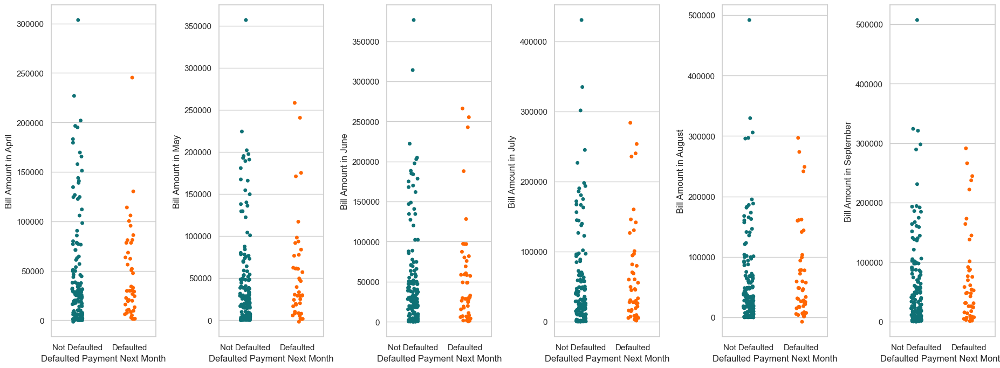

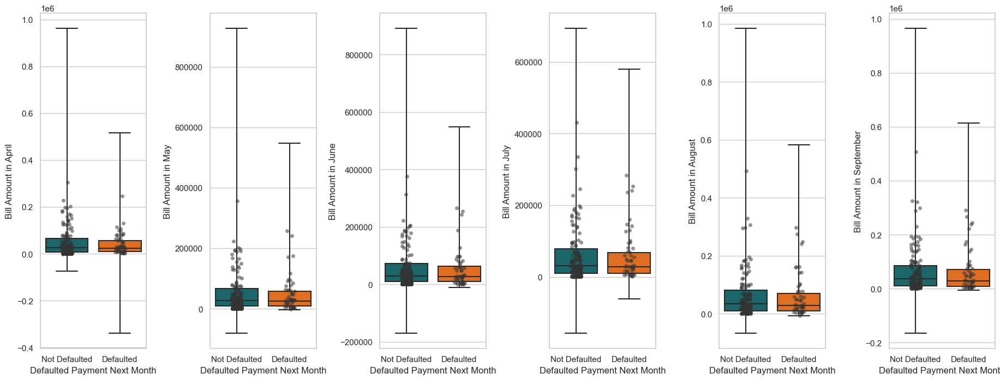

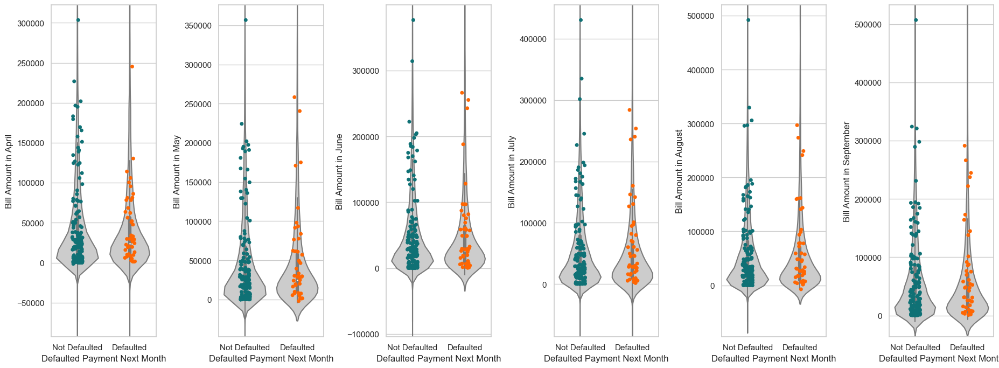

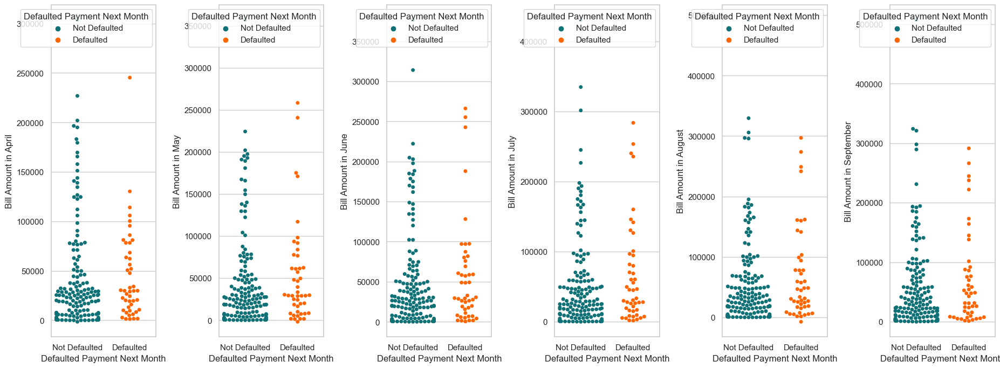

In [197]:
plt.figure(figsize=(20, 8))
plt.subplots_adjust(wspace=0.6, right=1)
plt.subplot(1, 6, 1)
plot_numeric_and_categorical('Bill Amount in April', 'Defaulted Payment Next Month', 'strip', defaulted_color, sample_size=200)
plt.subplot(1, 6, 2)
plot_numeric_and_categorical('Bill Amount in May', 'Defaulted Payment Next Month', 'strip', defaulted_color, sample_size=200)
plt.subplot(1, 6, 3)
plot_numeric_and_categorical('Bill Amount in June', 'Defaulted Payment Next Month', 'strip', defaulted_color, sample_size=200)
plt.subplot(1, 6, 4)
plot_numeric_and_categorical('Bill Amount in July', 'Defaulted Payment Next Month', 'strip', defaulted_color, sample_size=200)
plt.subplot(1, 6, 5)
plot_numeric_and_categorical('Bill Amount in August', 'Defaulted Payment Next Month', 'strip', defaulted_color, sample_size=200)
plt.subplot(1, 6, 6)
plot_numeric_and_categorical('Bill Amount in September', 'Defaulted Payment Next Month', 'strip', defaulted_color, sample_size=200)
plt.figure(figsize=(20, 8))
plt.subplots_adjust(wspace=0.6, right=1)
plt.subplot(1, 6, 1)
plot_numeric_and_categorical('Bill Amount in April', 'Defaulted Payment Next Month', 'box', defaulted_color, sample_size=200)
plt.subplot(1, 6, 2)
plot_numeric_and_categorical('Bill Amount in May', 'Defaulted Payment Next Month', 'box', defaulted_color, sample_size=200)
plt.subplot(1, 6, 3)
plot_numeric_and_categorical('Bill Amount in June', 'Defaulted Payment Next Month', 'box', defaulted_color, sample_size=200)
plt.subplot(1, 6, 4)
plot_numeric_and_categorical('Bill Amount in July', 'Defaulted Payment Next Month', 'box', defaulted_color, sample_size=200)
plt.subplot(1, 6, 5)
plot_numeric_and_categorical('Bill Amount in August', 'Defaulted Payment Next Month', 'box', defaulted_color, sample_size=200)
plt.subplot(1, 6, 6)
plot_numeric_and_categorical('Bill Amount in September', 'Defaulted Payment Next Month', 'box', defaulted_color, sample_size=200)
plt.figure(figsize=(20, 8))
plt.subplots_adjust(wspace=0.6, right=1)
plt.subplot(1, 6, 1)
plot_numeric_and_categorical('Bill Amount in April', 'Defaulted Payment Next Month', 'violin', defaulted_color, sample_size=200)
plt.subplot(1, 6, 2)
plot_numeric_and_categorical('Bill Amount in May', 'Defaulted Payment Next Month', 'violin', defaulted_color, sample_size=200)
plt.subplot(1, 6, 3)
plot_numeric_and_categorical('Bill Amount in June', 'Defaulted Payment Next Month', 'violin', defaulted_color, sample_size=200)
plt.subplot(1, 6, 4)
plot_numeric_and_categorical('Bill Amount in July', 'Defaulted Payment Next Month', 'violin', defaulted_color, sample_size=200)
plt.subplot(1, 6, 5)
plot_numeric_and_categorical('Bill Amount in August', 'Defaulted Payment Next Month', 'violin', defaulted_color, sample_size=200)
plt.subplot(1, 6, 6)
plot_numeric_and_categorical('Bill Amount in September', 'Defaulted Payment Next Month', 'violin', defaulted_color, sample_size=200)
plt.figure(figsize=(20, 8))
plt.subplots_adjust(wspace=0.6, right=1)
plt.subplot(1, 6, 1)
plot_numeric_and_categorical('Bill Amount in April', 'Defaulted Payment Next Month', 'swarm', defaulted_color, sample_size=200)
plt.subplot(1, 6, 2)
plot_numeric_and_categorical('Bill Amount in May', 'Defaulted Payment Next Month', 'swarm', defaulted_color, sample_size=200)
plt.subplot(1, 6, 3)
plot_numeric_and_categorical('Bill Amount in June', 'Defaulted Payment Next Month', 'swarm', defaulted_color, sample_size=200)
plt.subplot(1, 6, 4)
plot_numeric_and_categorical('Bill Amount in July', 'Defaulted Payment Next Month', 'swarm', defaulted_color, sample_size=200)
plt.subplot(1, 6, 5)
plot_numeric_and_categorical('Bill Amount in August', 'Defaulted Payment Next Month', 'swarm', defaulted_color, sample_size=200)
plt.subplot(1, 6, 6)
plot_numeric_and_categorical('Bill Amount in September', 'Defaulted Payment Next Month', 'swarm', defaulted_color, sample_size=200)

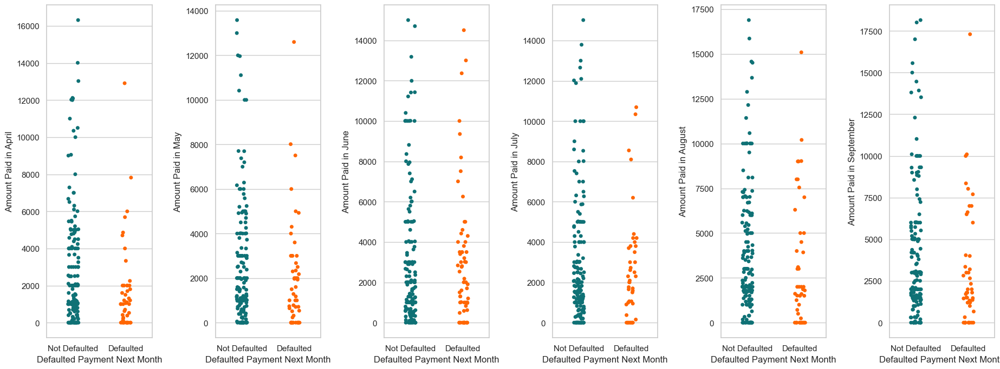

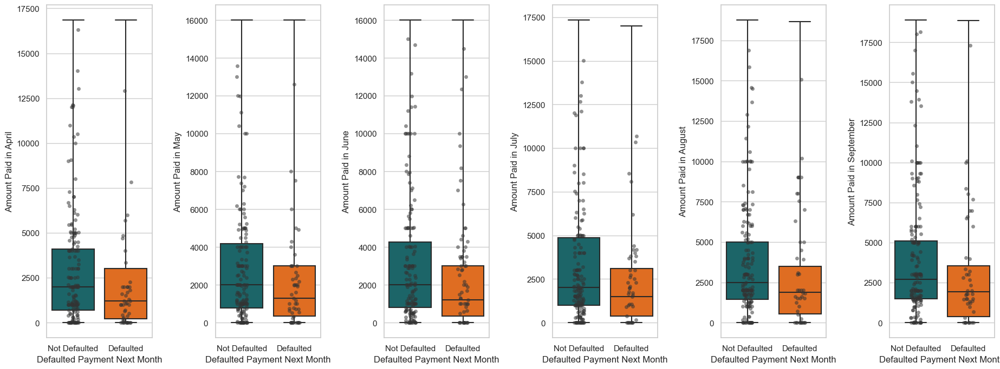

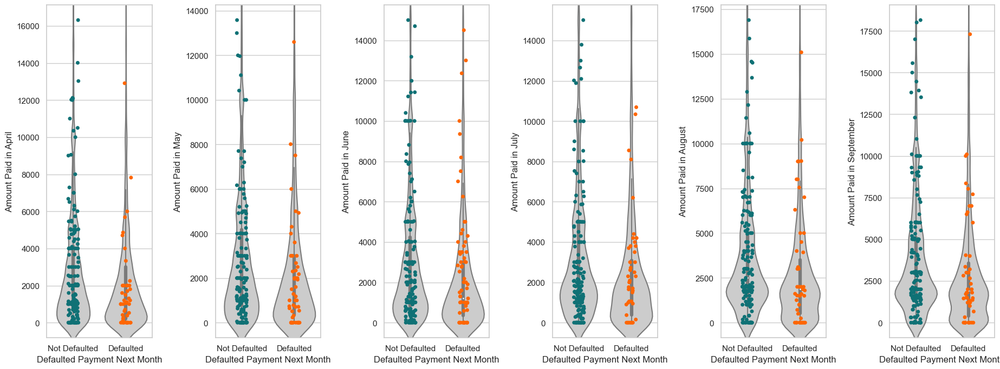

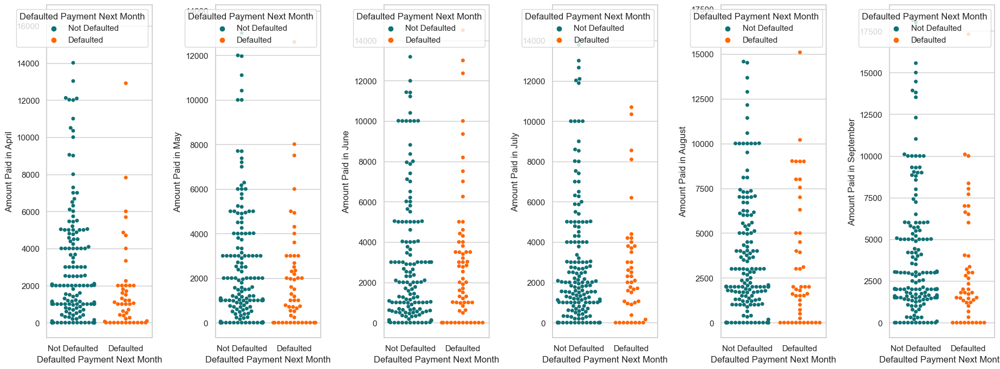

In [198]:
plt.figure(figsize=(20, 8))
plt.subplots_adjust(wspace=0.6, right=1)
plt.subplot(1, 6, 1)
plot_numeric_and_categorical('Amount Paid in April', 'Defaulted Payment Next Month', 'strip', defaulted_color, sample_size=200, hide_outliers=True)
plt.subplot(1, 6, 2)
plot_numeric_and_categorical('Amount Paid in May', 'Defaulted Payment Next Month', 'strip', defaulted_color, sample_size=200, hide_outliers=True)
plt.subplot(1, 6, 3)
plot_numeric_and_categorical('Amount Paid in June', 'Defaulted Payment Next Month', 'strip', defaulted_color, sample_size=200, hide_outliers=True)
plt.subplot(1, 6, 4)
plot_numeric_and_categorical('Amount Paid in July', 'Defaulted Payment Next Month', 'strip', defaulted_color, sample_size=200, hide_outliers=True)
plt.subplot(1, 6, 5)
plot_numeric_and_categorical('Amount Paid in August', 'Defaulted Payment Next Month', 'strip', defaulted_color, sample_size=200, hide_outliers=True)
plt.subplot(1, 6, 6)
plot_numeric_and_categorical('Amount Paid in September', 'Defaulted Payment Next Month', 'strip', defaulted_color, sample_size=200, hide_outliers=True)
plt.figure(figsize=(20, 8))
plt.subplots_adjust(wspace=0.6, right=1)
plt.subplot(1, 6, 1)
plot_numeric_and_categorical('Amount Paid in April', 'Defaulted Payment Next Month', 'box', defaulted_color, sample_size=200, hide_outliers=True)
plt.subplot(1, 6, 2)
plot_numeric_and_categorical('Amount Paid in May', 'Defaulted Payment Next Month', 'box', defaulted_color, sample_size=200, hide_outliers=True)
plt.subplot(1, 6, 3)
plot_numeric_and_categorical('Amount Paid in June', 'Defaulted Payment Next Month', 'box', defaulted_color, sample_size=200, hide_outliers=True)
plt.subplot(1, 6, 4)
plot_numeric_and_categorical('Amount Paid in July', 'Defaulted Payment Next Month', 'box', defaulted_color, sample_size=200, hide_outliers=True)
plt.subplot(1, 6, 5)
plot_numeric_and_categorical('Amount Paid in August', 'Defaulted Payment Next Month', 'box', defaulted_color, sample_size=200, hide_outliers=True)
plt.subplot(1, 6, 6)
plot_numeric_and_categorical('Amount Paid in September', 'Defaulted Payment Next Month', 'box', defaulted_color, sample_size=200, hide_outliers=True)
plt.figure(figsize=(20, 8))
plt.subplots_adjust(wspace=0.6, right=1)
plt.subplot(1, 6, 1)
plot_numeric_and_categorical('Amount Paid in April', 'Defaulted Payment Next Month', 'violin', defaulted_color, sample_size=200, hide_outliers=True)
plt.subplot(1, 6, 2)
plot_numeric_and_categorical('Amount Paid in May', 'Defaulted Payment Next Month', 'violin', defaulted_color, sample_size=200, hide_outliers=True)
plt.subplot(1, 6, 3)
plot_numeric_and_categorical('Amount Paid in June', 'Defaulted Payment Next Month', 'violin', defaulted_color, sample_size=200, hide_outliers=True)
plt.subplot(1, 6, 4)
plot_numeric_and_categorical('Amount Paid in July', 'Defaulted Payment Next Month', 'violin', defaulted_color, sample_size=200, hide_outliers=True)
plt.subplot(1, 6, 5)
plot_numeric_and_categorical('Amount Paid in August', 'Defaulted Payment Next Month', 'violin', defaulted_color, sample_size=200, hide_outliers=True)
plt.subplot(1, 6, 6)
plot_numeric_and_categorical('Amount Paid in September', 'Defaulted Payment Next Month', 'violin', defaulted_color, sample_size=200, hide_outliers=True)
plt.figure(figsize=(20, 8))
plt.subplots_adjust(wspace=0.6, right=1)
plt.subplot(1, 6, 1)
plot_numeric_and_categorical('Amount Paid in April', 'Defaulted Payment Next Month', 'swarm', defaulted_color, sample_size=200, hide_outliers=True)
plt.subplot(1, 6, 2)
plot_numeric_and_categorical('Amount Paid in May', 'Defaulted Payment Next Month', 'swarm', defaulted_color, sample_size=200, hide_outliers=True)
plt.subplot(1, 6, 3)
plot_numeric_and_categorical('Amount Paid in June', 'Defaulted Payment Next Month', 'swarm', defaulted_color, sample_size=200, hide_outliers=True)
plt.subplot(1, 6, 4)
plot_numeric_and_categorical('Amount Paid in July', 'Defaulted Payment Next Month', 'swarm', defaulted_color, sample_size=200, hide_outliers=True)
plt.subplot(1, 6, 5)
plot_numeric_and_categorical('Amount Paid in August', 'Defaulted Payment Next Month', 'swarm', defaulted_color, sample_size=200, hide_outliers=True)
plt.subplot(1, 6, 6)
plot_numeric_and_categorical('Amount Paid in September', 'Defaulted Payment Next Month', 'swarm', defaulted_color, sample_size=200, hide_outliers=True)

### Pairplots

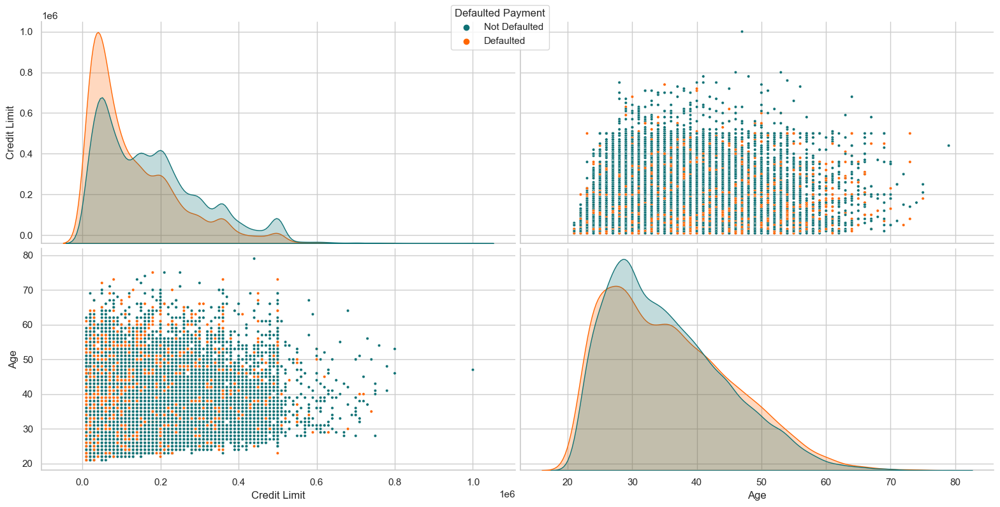

In [199]:
def plot_pairplot_with_target_hue(columns, alpha=1, size=10) -> None:
    ax = sns.pairplot(
        size=4,
        aspect=2,
        data=numeric_df,
        vars=columns,
        hue='Defaulted Payment',
        palette=defaulted_color,
        plot_kws={'alpha': alpha, 's': size},
        diag_kws={'common_norm': False}
    )
    sns.move_legend(ax, 'upper center', frameon=True)

plot_pairplot_with_target_hue(['Credit Limit', 'Age'])

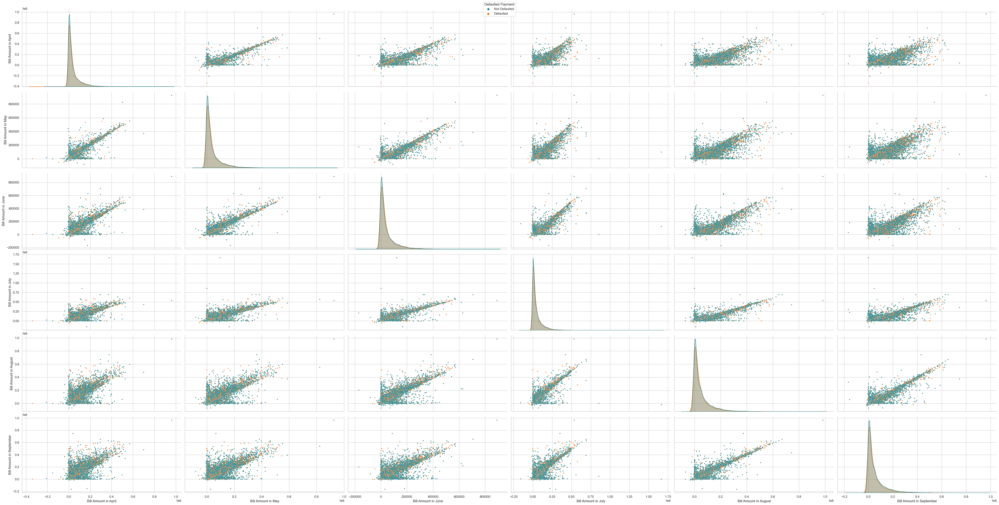

In [200]:
plot_pairplot_with_target_hue(['Bill Amount in April', 'Bill Amount in May', 'Bill Amount in June', 'Bill Amount in July', 'Bill Amount in August', 'Bill Amount in September'])

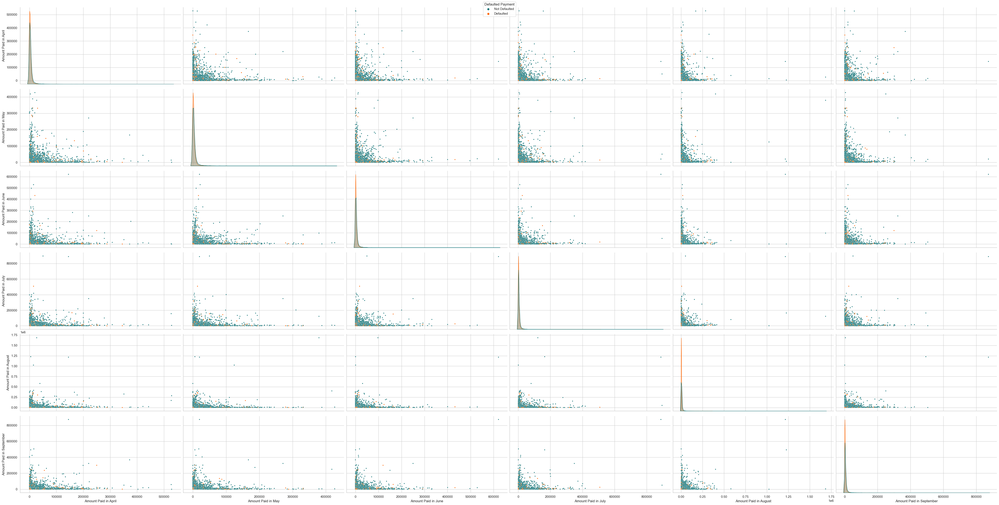

In [201]:
plot_pairplot_with_target_hue(['Amount Paid in April', 'Amount Paid in May', 'Amount Paid in June', 'Amount Paid in July', 'Amount Paid in August', 'Amount Paid in September'])

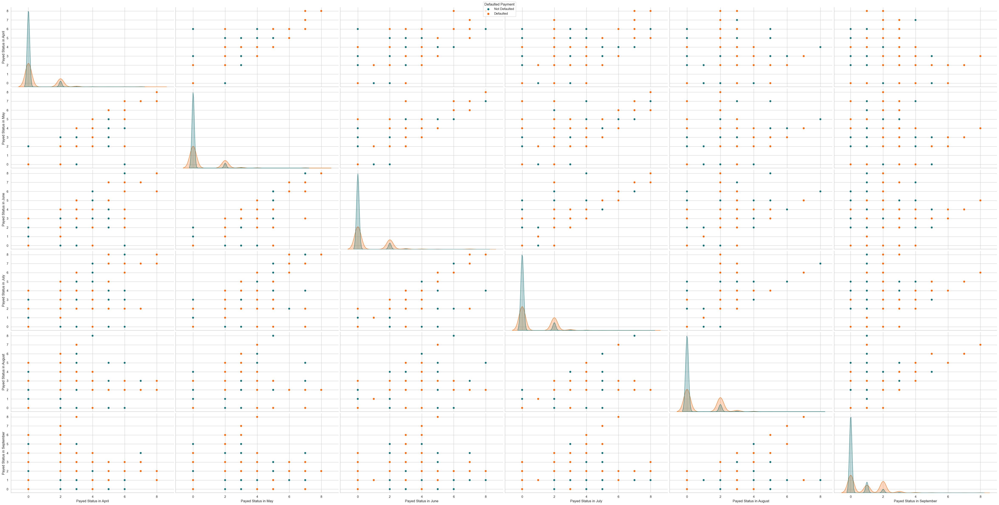

In [202]:
plot_pairplot_with_target_hue(['Payed Status in April', 'Payed Status in May', 'Payed Status in June', 'Payed Status in July', 'Payed Status in August', 'Payed Status in September'], size=50)

## Análisis de Regresión Lineal

In [203]:
reg_model = (
    smf.ols(
        formula=f"Q('Defaulted Payment Next Month') ~ " + ' + '.join([f"Q('{x}')" for x in numeric_df.columns if not x in ['Defaulted Payment Next Month', 'Defaulted Payment']]),
        data=numeric_df
    )
    .fit()
)
reg_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                    OLS Regression Results                                   
=============================================================================================
Dep. Variable:     Q('Defaulted Payment Next Month')   R-squared:                       0.210
Model:                                           OLS   Adj. R-squared:                  0.210
Method:                                Least Squares   F-statistic:                     267.8
Date:                               Fri, 03 May 2024   Prob (F-statistic):               0.00
Time:                                       19:26:32   Log-Likelihood:                -10135.
No. Observations:                              23150   AIC:                         2.032e+04
Df Residuals:                                  23126   BIC:                         2.051e+04
Df Model:                                         23                                         
Covariance Type:                           nonrobust                                         
==================================================================================================
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept                          0.1336      0.015      8.847      0.000       0.104       0.163
Q('Credit Limit')              -2.967e-07   2.39e-08    -12.398      0.000   -3.44e-07    -2.5e-07
Q('Sex')                          -0.0180      0.005     -3.548      0.000      -0.028      -0.008
Q('Education')                     0.0057      0.004      1.500      0.134      -0.002       0.013
Q('Marriage')                      0.0241      0.005      4.575      0.000       0.014       0.034
Q('Age')                           0.0004      0.000      1.403      0.161      -0.000       0.001
Q('Payed Status in September')     0.1688      0.005     37.175      0.000       0.160       0.178
Q('Payed Status in August')        0.0084      0.005      1.796      0.073      -0.001       0.018
Q('Payed Status in July')          0.0209      0.005      4.603      0.000       0.012       0.030
Q('Payed Status in June')          0.0092      0.005      1.818      0.069      -0.001       0.019
Q('Payed Status in May')           0.0171      0.006      3.037      0.002       0.006       0.028
Q('Payed Status in April')         0.0324      0.005      6.827      0.000       0.023       0.042
Q('Bill Amount in September')  -2.756e-07   1.32e-07     -2.085      0.037   -5.35e-07   -1.65e-08
Q('Bill Amount in August')      3.716e-07   1.78e-07      2.088      0.037    2.27e-08     7.2e-07
Q('Bill Amount in July')        3.867e-08    1.7e-07      0.227      0.820   -2.95e-07    3.72e-07
Q('Bill Amount in June')        5.464e-08   1.72e-07      0.318      0.751   -2.83e-07    3.92e-07
Q('Bill Amount in May')        -7.657e-08   1.95e-07     -0.393      0.694   -4.58e-07    3.05e-07
Q('Bill Amount in April')       2.963e-08   1.53e-07      0.193      0.847   -2.71e-07     3.3e-07
Q('Amount Paid in September')  -6.872e-07   1.95e-07     -3.522      0.000   -1.07e-06   -3.05e-07
Q('Amount Paid in August')     -1.913e-07   1.66e-07     -1.154      0.249   -5.16e-07    1.34e-07
Q('Amount Paid in July')         1.84e-08    1.8e-07      0.103      0.918   -3.33e-07     3.7e-07
Q('Amount Paid in June')       -3.049e-08   1.98e-07     -0.154      0.878   -4.19e-07    3.58e-07
Q('Amount Paid in May')        -2.091e-07   2.08e-07     -1.007      0.314   -6.16e-07    1.98e-07
Q('Amount Paid in April')       1.815e-08   1.54e-07      0.118      0.906   -2.84e-07     3.2e-07
==============================================================================
Omnibus:                     3252.030   Durbin-Watson:                   1.991
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             4833.363
Skew:   

## Análisis de Regresión Logística

In [204]:
logit_model = (
    smf.logit(
        formula=f"Q('Defaulted Payment Next Month') ~ " + ' + '.join([f"Q('{x}')" for x in numeric_df.columns if not x in ['Defaulted Payment Next Month', 'Defaulted Payment']]),
        data=numeric_df
    )
    .fit()
)
logit_model.summary()

Optimization terminated successfully.
         Current function value: 0.442349
         Iterations 7


<class 'statsmodels.iolib.summary.Summary'>
"""
                                   Logit Regression Results                                  
=============================================================================================
Dep. Variable:     Q('Defaulted Payment Next Month')   No. Observations:                23150
Model:                                         Logit   Df Residuals:                    23126
Method:                                          MLE   Df Model:                           23
Date:                               Fri, 03 May 2024   Pseudo R-squ.:                  0.1827
Time:                                       19:26:33   Log-Likelihood:                -10240.
converged:                                      True   LL-Null:                       -12529.
Covariance Type:                           nonrobust   LLR p-value:                     0.000
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept                         -1.8815      0.108    -17.395      0.000      -2.094      -1.670
Q('Credit Limit')              -2.228e-06   2.02e-07    -11.054      0.000   -2.62e-06   -1.83e-06
Q('Sex')                          -0.1307      0.036     -3.619      0.000      -0.202      -0.060
Q('Education')                     0.0520      0.027      1.906      0.057      -0.001       0.106
Q('Marriage')                      0.1718      0.038      4.554      0.000       0.098       0.246
Q('Age')                           0.0030      0.002      1.412      0.158      -0.001       0.007
Q('Payed Status in September')     0.9106      0.028     32.458      0.000       0.856       0.966
Q('Payed Status in August')        0.0252      0.029      0.883      0.377      -0.031       0.081
Q('Payed Status in July')          0.1152      0.030      3.842      0.000       0.056       0.174
Q('Payed Status in June')          0.0760      0.033      2.298      0.022       0.011       0.141
Q('Payed Status in May')           0.0923      0.036      2.600      0.009       0.023       0.162
Q('Payed Status in April')         0.1673      0.030      5.556      0.000       0.108       0.226
Q('Bill Amount in September')  -3.493e-06   1.33e-06     -2.622      0.009    -6.1e-06   -8.82e-07
Q('Bill Amount in August')      3.677e-06   1.67e-06      2.205      0.027    4.09e-07    6.94e-06
Q('Bill Amount in July')        1.564e-06   1.42e-06      1.100      0.271   -1.22e-06    4.35e-06
Q('Bill Amount in June')        3.998e-07   1.41e-06      0.284      0.776   -2.36e-06    3.16e-06
Q('Bill Amount in May')        -6.922e-08   1.58e-06     -0.044      0.965   -3.17e-06    3.03e-06
Q('Bill Amount in April')      -5.163e-07   1.25e-06     -0.413      0.680   -2.97e-06    1.93e-06
Q('Amount Paid in September')   -1.05e-05   2.36e-06     -4.447      0.000   -1.51e-05   -5.87e-06
Q('Amount Paid in August')     -7.823e-06   2.32e-06     -3.369      0.001   -1.24e-05   -3.27e-06
Q('Amount Paid in July')        -7.56e-07   1.73e-06     -0.437      0.662   -4.15e-06    2.64e-06
Q('Amount Paid in June')       -1.317e-06   1.87e-06     -0.703      0.482   -4.99e-06    2.35e-06
Q('Amount Paid in May')        -1.953e-06      2e-06     -0.976      0.329   -5.88e-06    1.97e-06
Q('Amount Paid in April')      -2.603e-08   1.38e-06     -0.019      0.985   -2.74e-06    2.69e-06
==================================================================================================
"""

Accuracy: 0.8178333333333333


Text(1311.3676470588236, 0.5, 'Actual')

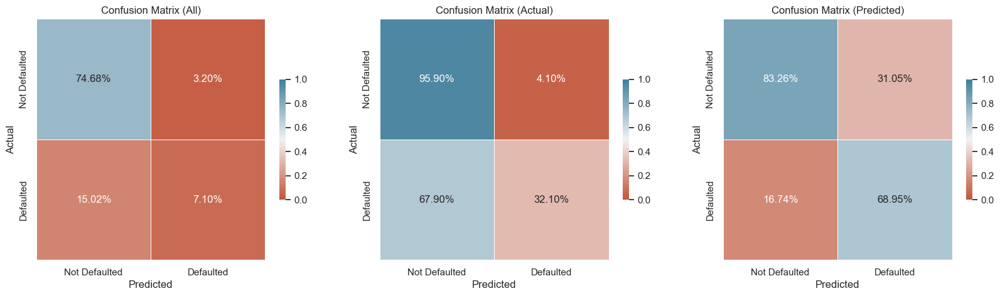

In [227]:
predictions = logit_model.predict(numeric_df.drop(columns=['Defaulted Payment Next Month', 'Defaulted Payment']))
print("Accuracy:", sklearn.metrics.accuracy_score(numeric_df['Defaulted Payment Next Month'], predictions > 0.5))
confusion_matrix_all = sklearn.metrics.confusion_matrix(numeric_df['Defaulted Payment Next Month'], predictions > 0.5, normalize='all')
confusion_matrix_true = sklearn.metrics.confusion_matrix(numeric_df['Defaulted Payment Next Month'], predictions > 0.5, normalize='true')
confusion_matrix_pred = sklearn.metrics.confusion_matrix(numeric_df['Defaulted Payment Next Month'], predictions > 0.5, normalize='pred')
plt.figure(figsize=(20, 5))
plt.subplot(1, 3, 1)
plt.title('Confusion Matrix (All)')
sns.heatmap(
    confusion_matrix_all,
    annot=True,
    cmap=sns.diverging_palette(20, 230, as_cmap=True),
    center=0.5,
    vmin=0,
    vmax=1,
    linewidths=0.5,
    cbar_kws={"shrink": 0.5},
    fmt='.2%',
    xticklabels=['Not Defaulted', 'Defaulted'],
    yticklabels=['Not Defaulted', 'Defaulted'],
)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.subplot(1, 3, 2)
plt.title('Confusion Matrix (Actual)')
sns.heatmap(
    confusion_matrix_true,
    annot=True,
    cmap=sns.diverging_palette(20, 230, as_cmap=True),
    center=0.5,
    vmin=0,
    vmax=1,
    linewidths=0.5,
    cbar_kws={"shrink": 0.5},
    fmt='.2%',
    xticklabels=['Not Defaulted', 'Defaulted'],
    yticklabels=['Not Defaulted', 'Defaulted'],
)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.subplot(1, 3, 3)
plt.title('Confusion Matrix (Predicted)')
sns.heatmap(
    confusion_matrix_pred,
    annot=True,
    cmap=sns.diverging_palette(20, 230, as_cmap=True),
    center=0.5,
    vmin=0,
    vmax=1,
    linewidths=0.5,
    cbar_kws={"shrink": 0.5},
    fmt='.2%',
    xticklabels=['Not Defaulted', 'Defaulted'],
    yticklabels=['Not Defaulted', 'Defaulted'],
)
plt.xlabel('Predicted')
plt.ylabel('Actual')